# CNC Dataset Classification Problem

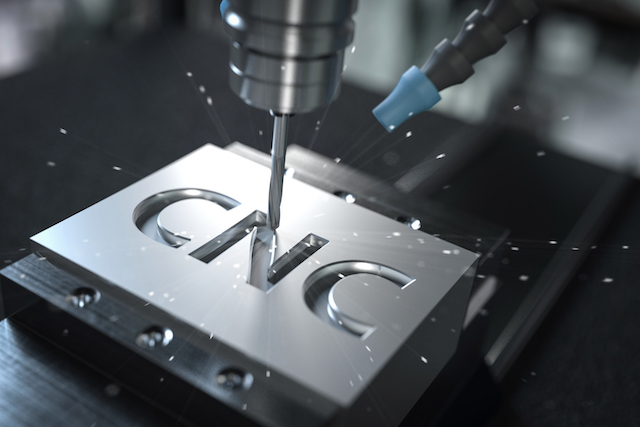

#  Introduction: 

    In this project, we decided to work with the dataset containing a series of machining experiments were run on 2" x 2" x 1.5" wax blocks in a CNC milling machine in the System-level Manufacturing and Automation Research Testbed (SMART) at the University of Michigan. Machining data was collected from the PLCs that control our CNC machines for variations in tool condition, federate, and clamp pressure used in initial machining conditions. Each experiment produced a finished wax part with an "S" shape carved into the top face.

      
#  What is CNC? 

    Computer numerical control (CNC) is a manufacturing method that automates the control, movement and precision of machine tools through the use of preprogrammed computer software, which is embedded inside the tools.

    CNC is commonly used in manufacturing for machining metal and plastic parts. Mills, lathes, routers, drills, grinders, water jets and lasers are common cutting tools whose operations can also be automated with CNC. It can also be used to control non-machine tools, such as welding, electronic assembly and filament-winding machines.


#  Objectives: 

    Our goals:

    1. To develop a ML model that predicts three targets

    3. To find insights in the various CNC measurements.


#  Description:  

    1. Type of problem: classification.

    2. Variables:

        Experiment:

            #: experiment number

            Material: machinable wax

            Tool Condition: worn tool or unworn tool

            Feedrate: spindle speed (mm/s)

            Clamp Pressure: pressure used to hold parts in place (bars)

        X1:

            ActualPosition: actual x position of the part (mm)

            ActualVelocity: actual x velocity of the part (mm/s)

            ActualAcceleration: actual x acceleration of part (mm/s/s)

            CommandPosition: reference x position of part (mm)

            CommandVelocity: reference x velocity of part (mm/s)

            CommandAcceleration: reference x acceleration of part (mm/s/s)

            CurrentFeedback: current (A)

            DCBusVoltage: voltage (V)

            OutputCurrent: current (A)

            OutputVoltage: voltage (V)

            OutputPower: power (in kW)

        Y1:

            ActualPosition: actual y position of part (mm)

            ActualVelocity: actual y velocity of part (mm/s)

            ActualAcceleration: actual y acceleration of the part (mm/s/s)

            CommandPosition: reference y position of part (mm)

            CommandVelocity: reference y velocity of the part (mm/s)

            CommandAcceleration: reference y acceleration of part (mm/s/s)

            CurrentFeedback: current (A)

            DCBusVoltage: voltage (V)

            OutputCurrent: current (A)

            OutputVoltage: voltage (V)

            OutputPower: power (kW)

        Z1:

            ActualPosition: actual z position of the part (mm)

            ActualVelocity: actual z velocity of the part (mm/s)

            ActualAcceleration: actual z acceleration of the part (mm/s/s)

            CommandPosition: reference z position of part (mm)

            CommandVelocity: reference z velocity of the part (mm/s)

            CommandAcceleration: reference  z acceleration of part (mm/s/s)

            CurrentFeedback: current (A)

            DCBusVoltage: voltage (V)

            OutputCurrent: current (A)

            OutputVoltage: voltage (V)

        S1:

            ActualPosition: actual position of spindle (mm)

            ActualVelocity: actual velocity of spindle (mm/s)

            ActualAcceleration: actual acceleration of spindle (mm/s/s)

            CommandPosition: reference position of spindle (mm)

            CommandVelocity: reference velocity of spindle (mm/s)

            CommandAcceleration: reference acceleration of spindle (mm/s/s)

            CurrentFeedback: current (A)

            DCBusVoltage: voltage (V)

            OutputCurrent: current (A)

            OutputVoltage: voltage (V)

            OutputPower: current (A)

            SystemInertia: torque inertia (kg*m^2)

        M1:

            M1_CURRENT_PROGRAM_NUMBER: number the program is listed under on the CNC

            M1_sequence_number: line of G-code being executed

            M1_CURRENT_FEEDRATE: spindle speed (mm/s)

        Machining:

            Process: current machining stage is being performed. Includes preparation, tracing up and down the "S" curve involving different layers, and repositioning of the spindle as it moves through the air to a certain starting point

            Finalizes: machining process able to complete without the part moving out of the pneumatic vise

            Visual Inspection: The finished part had adequate geometry and surface finish. An experiment that fails to finalize will have "NA"

    3. Target:

        1.tool_condition

        2.machining_finalized

        3.passed_visual_inspection

    4. Steps We made

        1. Encode Machining_Process

        2. Train / Test split:

            > Train - 77%

            > Test - 33%

        3. Scaling

            > StandardScaler

        4. Balancing:

            > RandomOverSampler

            > RandomUnderSampler

        5. Training Classification Algorithms

        6. Fine-tuning hyperparameters:

            > RanomizedSearchCV

        7. Model evaluation and result analysis

    5. ML Algorithms we used:

        1. RandomForest Classifier

        2. GradientBoost Classifier  

        3. DecistionTree Classifier

        4. KNeighbors Classifier

        5. XGB Classifier

 

    6. Evaluation metrix we used: 

        1. Confusion Matrix

        2. Roc-auc

        3. Precision

        4. Recall

        5. Accuracy

# STEP 0: Importing libraries

In [2]:
#libraries for Loading dataset and linear algebra
import pandas as pd
import numpy as np
import scipy.stats as stats
import math
from collections import Counter

#libraries for Visualising data
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from mlens.visualization import corrmat
from wordcloud import WordCloud
import altair as alt

#libraries for Spliting data set
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict

#libraries for feature engineering
from sklearn.feature_extraction.text import CountVectorizer

#libraries for balancing the dataset
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler

#libraries for Feature magnitude
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler

#libraries for ML models: Classification
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB

#libraries for Pipelines and Column Tranformers
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer, make_column_selector

#libraries for hyperparametres tuning
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

#libraries for Matrixes for evaluating models
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report
from sklearn.metrics import precision_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

#libraries for saving models
from pickle import dump, load

from jupyterthemes import jtplot
jtplot.style()

[MLENS] backend: threading


# STEP 1: Data analysis

## Importing dataset

In [2]:
df_CNC = pd.read_csv('input/input/train.csv')
df_CNC = df_CNC.fillna('no')

In [3]:
df_CNC

,No,material,feedrate,clamp_pressure,tool_condition,machining_finalized,passed_visual_inspection
0,1,wax,6,4.0,unworn,yes,yes
1,2,wax,20,4.0,unworn,yes,yes
2,3,wax,6,3.0,unworn,yes,yes
3,4,wax,6,2.5,unworn,no,no
4,5,wax,20,3.0,unworn,no,no
5,6,wax,6,4.0,worn,yes,no
6,7,wax,20,4.0,worn,no,no
7,8,wax,20,4.0,worn,yes,no
8,9,wax,15,4.0,worn,yes,no
9,10,wax,12,4.0,worn,yes,no


In [4]:
df_CNC['material'].unique()

array(['wax'], dtype=object)

    We can see that variable 'material' is constant

## Importing experiments

In [5]:
files = list()

for i in range(1, 19):
    exp_number = '0' + str(i) if i < 10 else str(i)
    
    file = pd.read_csv('input/input/experiment_{}.csv'.format(exp_number))
    row = df_CNC[df_CNC['No'] == i]
    file['exp_number'] = exp_number
    file['feedrate'] = row.iloc[0]['feedrate']
    file['clamp_pressure'] = row.iloc[0]['clamp_pressure']
    file['machining_finalized'] = 1 if row.iloc[0]['machining_finalized'] == 'yes' else 0
    file['passed_visual_inspection'] = 1 if row.iloc[0]['passed_visual_inspection'] == 'yes' else 0
    file['tool_condition'] = 1 if row.iloc[0]['tool_condition'] == 'worn' else 0

    files.append(file)

    We didn't add the variables 'No' because it has no prediction power and 'material' bacause it is constant variable having only 'wax' label

## Making full dataset

In [6]:
df_CNC_full = pd.concat(files, ignore_index = True)

df_CNC_full.dtypes

X1_ActualPosition            float64
X1_ActualVelocity            float64
X1_ActualAcceleration        float64
X1_CommandPosition           float64
X1_CommandVelocity           float64
X1_CommandAcceleration       float64
X1_CurrentFeedback           float64
X1_DCBusVoltage              float64
X1_OutputCurrent             float64
X1_OutputVoltage             float64
X1_OutputPower               float64
Y1_ActualPosition            float64
Y1_ActualVelocity            float64
Y1_ActualAcceleration        float64
Y1_CommandPosition           float64
Y1_CommandVelocity           float64
Y1_CommandAcceleration       float64
Y1_CurrentFeedback           float64
Y1_DCBusVoltage              float64
Y1_OutputCurrent             float64
Y1_OutputVoltage             float64
Y1_OutputPower               float64
Z1_ActualPosition            float64
Z1_ActualVelocity            float64
Z1_ActualAcceleration        float64
Z1_CommandPosition           float64
Z1_CommandVelocity           float64
Z

In [7]:
df_CNC_full

,X1_ActualPosition,X1_ActualVelocity,X1_ActualAcceleration,X1_CommandPosition,X1_CommandVelocity,X1_CommandAcceleration,X1_CurrentFeedback,X1_DCBusVoltage,X1_OutputCurrent,X1_OutputVoltage,...,M1_CURRENT_PROGRAM_NUMBER,M1_sequence_number,M1_CURRENT_FEEDRATE,Machining_Process,exp_number,feedrate,clamp_pressure,machining_finalized,passed_visual_inspection,tool_condition
0,198.0,0.00,0.00,198.0,0.00,0.000000,0.18,0.0207,329.0,2.77,...,1.0,0.0,50.0,Starting,01,6,4.0,1,1,0
1,198.0,-10.80,-350.00,198.0,-13.60,-358.000000,-10.90,0.1860,328.0,23.30,...,1.0,4.0,50.0,Prep,01,6,4.0,1,1,0
2,196.0,-17.80,-6.25,196.0,-17.90,-0.000095,-8.59,0.1400,328.0,30.60,...,1.0,7.0,50.0,Prep,01,6,4.0,1,1,0
3,194.0,-18.00,0.00,194.0,-17.90,-0.000095,-6.11,0.1300,327.0,30.30,...,1.0,7.0,50.0,Prep,01,6,4.0,1,1,0
4,193.0,-17.90,-18.80,192.0,-17.90,0.000095,-5.70,0.1140,328.0,30.50,...,1.0,7.0,50.0,Prep,01,6,4.0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25281,144.0,-2.30,100.00,144.0,-2.57,0.977000,-5.05,0.0732,327.0,9.56,...,1.0,57.0,3.0,End,18,3,2.5,1,1,1
25282,144.0,-2.47,25.00,144.0,-2.46,1.080000,-5.62,0.0996,327.0,10.30,...,1.0,57.0,3.0,End,18,3,2.5,1,1,1
25283,143.0,-2.20,81.20,143.0,-2.35,1.170000,-4.42,0.0539,327.0,7.79,...,1.0,57.0,3.0,End,18,3,2.5,1,1,1
25284,143.0,-2.05,68.70,143.0,-2.23,1.260000,-5.83,0.0809,327.0,8.32,...,1.0,57.0,3.0,End,18,3,2.5,1,1,1


## Exploring Machining Process

In [8]:
df_CNC_full['Machining_Process'].value_counts().sort_index()

End              2585
Layer 1 Down     2655
Layer 1 Up       4085
Layer 2 Down     2528
Layer 2 Up       3104
Layer 3 Down     2354
Layer 3 Up       2794
Prep             1795
Repositioning    3377
Starting            1
end                 8
Name: Machining_Process, dtype: int64

    the amount of labels 'Starting' and 'end' is relatively small and thus creates outliers

In [9]:
starting = df_CNC_full[df_CNC_full['Machining_Process'] == 'Starting']
end = df_CNC_full[df_CNC_full['Machining_Process'] == 'end']

In [10]:
print('there are {} "Starting" labels in Machining_Process in experiment_{}'.format(starting['exp_number'].value_counts().values[0], starting['exp_number'].value_counts().index[0]))
print('there are {} "end" labels in Machining_Process in experiment_{}'.format(end['exp_number'].value_counts().values[0], end['exp_number'].value_counts().index[0]))

there are 1 "Starting" labels in Machining_Process in experiment_01
there are 8 "end" labels in Machining_Process in experiment_01


    We can see that both 'Starting' and 'end' labels were at the first experiment

In [11]:
df_CNC_full.replace({'Machining_Process': {'Starting':'Prep','end':'End'}}, inplace=True)

    We replaced outlier labels 'Starting' and 'end', by combining them with labels 'Prep' and 'End'

In [12]:
df_CNC_full['Machining_Process'].value_counts().sort_index()

End              2593
Layer 1 Down     2655
Layer 1 Up       4085
Layer 2 Down     2528
Layer 2 Up       3104
Layer 3 Down     2354
Layer 3 Up       2794
Prep             1796
Repositioning    3377
Name: Machining_Process, dtype: int64

## Exploring Feedrate and Clamp_pressure

[Text(0, 0, '0.466'), Text(0, 0, '0.339'), Text(0, 0, '0.195')]

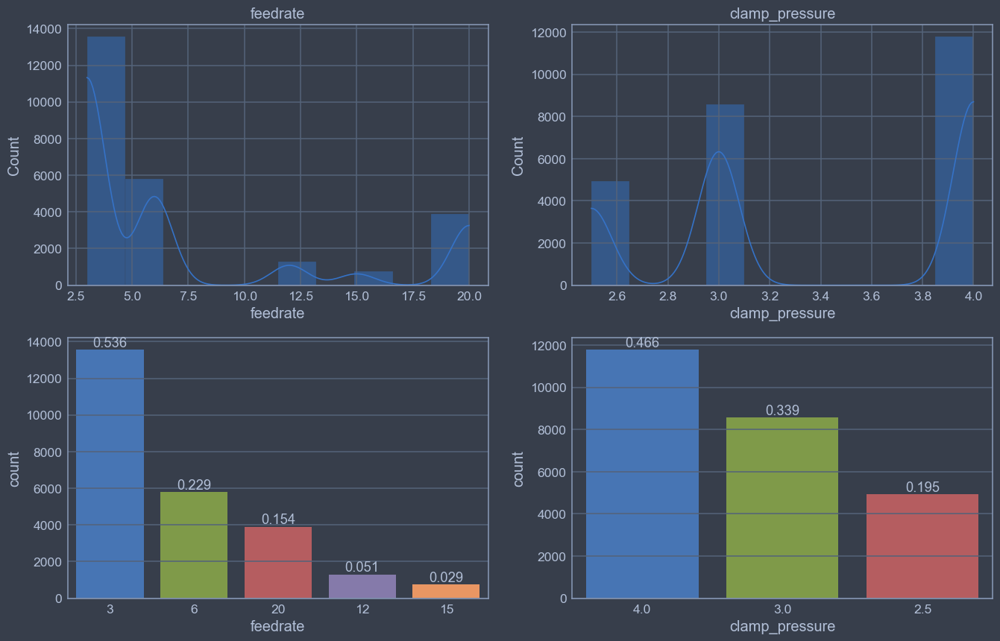

In [13]:
plt.figure(figsize = (16, 10))
# Feedrate distributaion
plt.subplot(2, 2, 1)
sns.histplot(x = 'feedrate', data = df_CNC_full, kde = True, bins = 10)
plt.title('feedrate')

# Clamp_pressure distributaion
plt.subplot(2, 2, 2)
sns.histplot(x = 'clamp_pressure', data = df_CNC_full, kde = True, bins = 10)
plt.title('clamp_pressure')

# Feedrate count_plot
plt.subplot(2, 2, 3)
ax = sns.countplot(x = 'feedrate', data = df_CNC_full, order = df_CNC_full['feedrate'].value_counts().index)
ax.bar_label(container = ax.containers[0], labels = round(df_CNC_full['feedrate'].value_counts() / len(df_CNC_full), 3), label_type = 'edge')

# Clamp_pressure count_plot
plt.subplot(2, 2, 4)
ax = sns.countplot(x = 'clamp_pressure', data = df_CNC_full, order = df_CNC_full['clamp_pressure'].value_counts().index)
ax.bar_label(container = ax.containers[0], labels = round(df_CNC_full['clamp_pressure'].value_counts() / len(df_CNC_full), 3), label_type = 'edge')

    We can see that more than half of samples were done with feedrate 3, while almost half of the samples had 4.0 pressure on clamp

## feedrate and clump_pressure VS tool_condition

In [14]:
worn = df_CNC_full[df_CNC_full['tool_condition'] == 1]
unworn = df_CNC_full[df_CNC_full['tool_condition'] == 0]

Text(0.5, 1.0, 'clamp_pressure (UNWORN)')

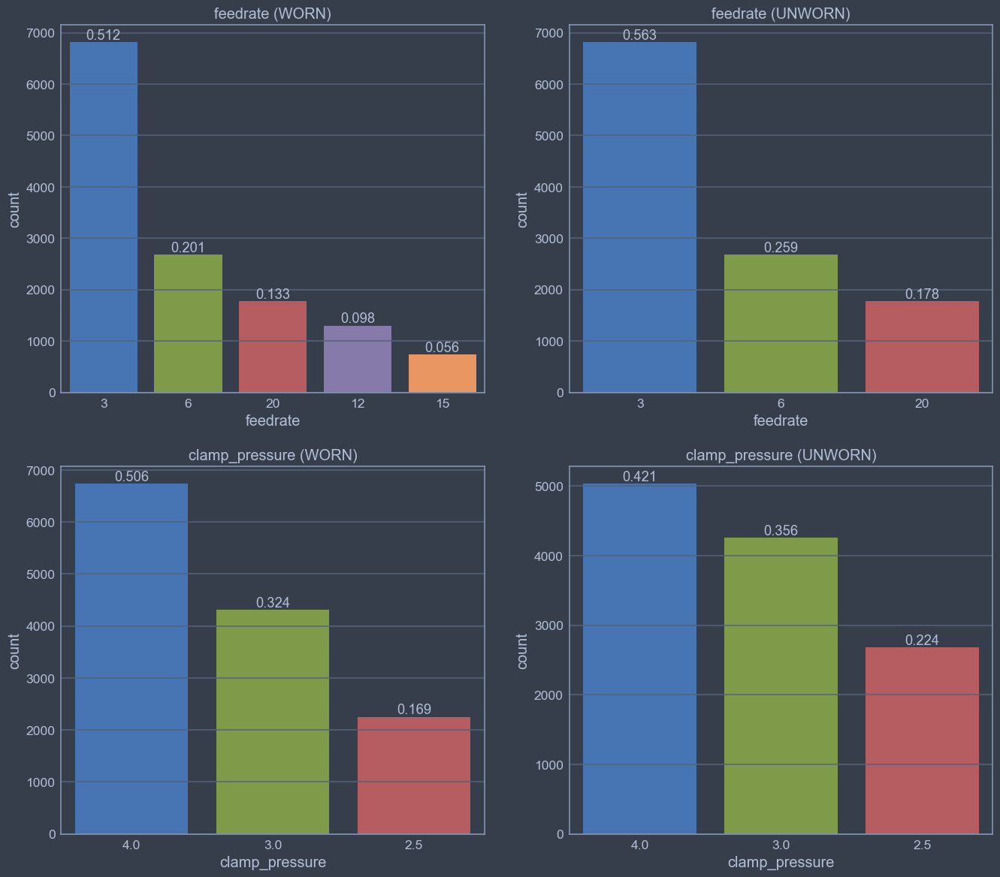

In [15]:
plt.figure(figsize = (16, 14))
# feedrate on worn tools
plt.subplot(2, 2, 1)
ax = sns.countplot(x = 'feedrate', data = worn, order = worn['feedrate'].value_counts().index)
ax.bar_label(container = ax.containers[0], labels = round(worn['feedrate'].value_counts() / len(worn), 3), label_type = 'edge')
plt.title('feedrate (WORN)')

# feedrate on unworn tools
plt.subplot(2, 2, 2)
ax = sns.countplot(x = 'feedrate', data = worn, order = unworn['feedrate'].value_counts().index)
ax.bar_label(container = ax.containers[0], labels = round(unworn['feedrate'].value_counts() / len(unworn), 3), label_type = 'edge')
plt.title('feedrate (UNWORN)')

# Clamp_pressure on worn tools
plt.subplot(2, 2, 3)
ax = sns.countplot(x = 'clamp_pressure', data = worn, order = worn['clamp_pressure'].value_counts().index)
ax.bar_label(container = ax.containers[0], labels = round(worn['clamp_pressure'].value_counts() / len(worn), 3), label_type = 'edge')
plt.title('clamp_pressure (WORN)')

# Clamp_pressure on uowarn tools
plt.subplot(2, 2, 4)
ax = sns.countplot(x = 'clamp_pressure', data = unworn, order = unworn['clamp_pressure'].value_counts().index)
ax.bar_label(container = ax.containers[0], labels = round(unworn['clamp_pressure'].value_counts() / len(unworn), 3), label_type = 'edge')
plt.title('clamp_pressure (UNWORN)')

    1. feedrate on worn machines has more variation like 12 and 15 which are being abset on unwarn tools, but feedrate 3 is still the most common one, taking more tham 50% on both worn and unworn tools
    2. clamp_pressure seems to not change significantly and having almost the same counts on both worn and unworn tools

## Exploring target varibales

In [16]:
# tool_condition pie_plot
for var in ['tool_condition', 'machining_finalized', 'passed_visual_inspection']:
    fig = px.pie(df_CNC_full, values = df_CNC_full[var].value_counts(), names = ['1', '0'], hole = 0.3, title = var)
    fig.update_traces(textposition = 'inside', textinfo = 'percent+label')
    fig.update_layout(template = 'plotly_dark')
    fig.show()

    There are several insights:
        1. nearly half of the experiment was made with worn tools, while other half with unworn
        2. more than 90% of experiments was successfuly finished by the machine
        3. more than 75% of experiment passed the visual inspection by human
        4. the count of details that didn't pass visual inspection by human is higher than the amount of details that didn't pass the machining process. We assume that is because humans has some tricks and techniques to detect failures and waste, which machines can't do

### machining_finalized and passsed_visual_inspection VS tool_condition

[Text(0, 0, '0.917'), Text(0, 0, '0.083')]

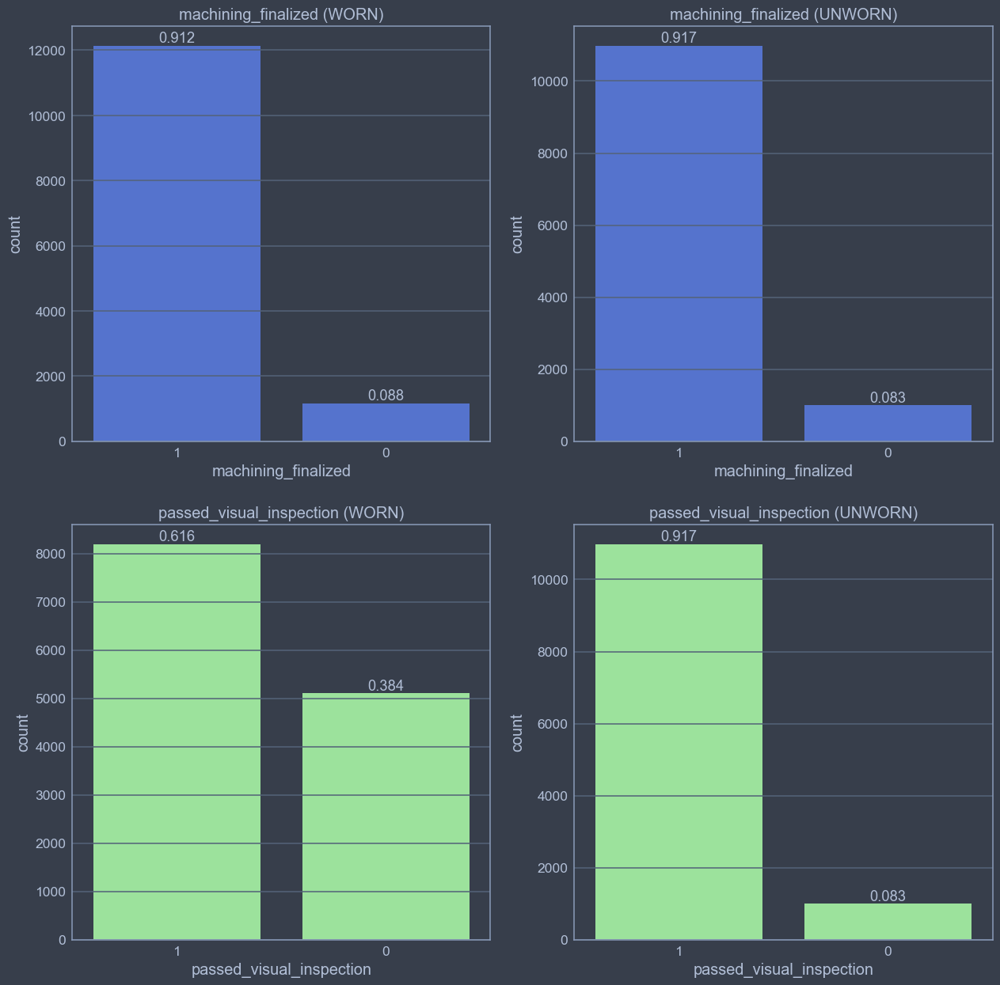

In [17]:
plt.figure(figsize = (15, 15))
# (Worn) machining_finalized
plt.subplot(2, 2, 1)
ax = sns.countplot(x = 'machining_finalized', data = worn, color = 'royalblue', order = worn['machining_finalized'].value_counts().index)
plt.title('machining_finalized (WORN)')
ax.bar_label(container = ax.containers[0], labels = round(worn['machining_finalized'].value_counts() / len(worn), 3), label_type = 'edge')

# (Unworn) machining_finalized
plt.subplot(2, 2, 2)
ax = sns.countplot(x = 'machining_finalized', data = unworn, color = 'royalblue', order = unworn['machining_finalized'].value_counts().index)
plt.title('machining_finalized (UNWORN)')
ax.bar_label(container = ax.containers[0], labels = round(unworn['machining_finalized'].value_counts() / len(unworn), 3), label_type = 'edge')

# (Worn) passed_visual_inspection
plt.subplot(2, 2, 3)
ax = sns.countplot(x = 'passed_visual_inspection', data = worn, color = 'lightgreen', order = worn['passed_visual_inspection'].value_counts().index)
plt.title('passed_visual_inspection (WORN)')
ax.bar_label(container = ax.containers[0], labels = round(worn['passed_visual_inspection'].value_counts() / len(worn), 3), label_type = 'edge')

# (Unworn) passed_visual_inspection
plt.subplot(2, 2, 4)
ax = sns.countplot(x = 'passed_visual_inspection', data = unworn, color = 'lightgreen', order = unworn['passed_visual_inspection'].value_counts().index)
plt.title('passed_visual_inspection (UNWORN)')
ax.bar_label(container = ax.containers[0], labels = round(unworn['passed_visual_inspection'].value_counts() / len(unworn), 3), label_type = 'edge')


    There are several insights:
        1. Count of 'Not Finalized Machining' with worn tools is almost the same as that with unworn tools. It means that regardless of the tool condition, the detail will be finished my the machine
        2. Count of 'Not Passed Visual Insepction with worn tool is relatively larger than that with unworn tool. 
        3. We assume that the tool condition does affect the process of machining itself, but not dramaticallly as the failure and waste can occur on unwarn tools as well, but in smaller propotions and unlike machines, humans can notice the difference affected by warn tools 

## Correlation matrix

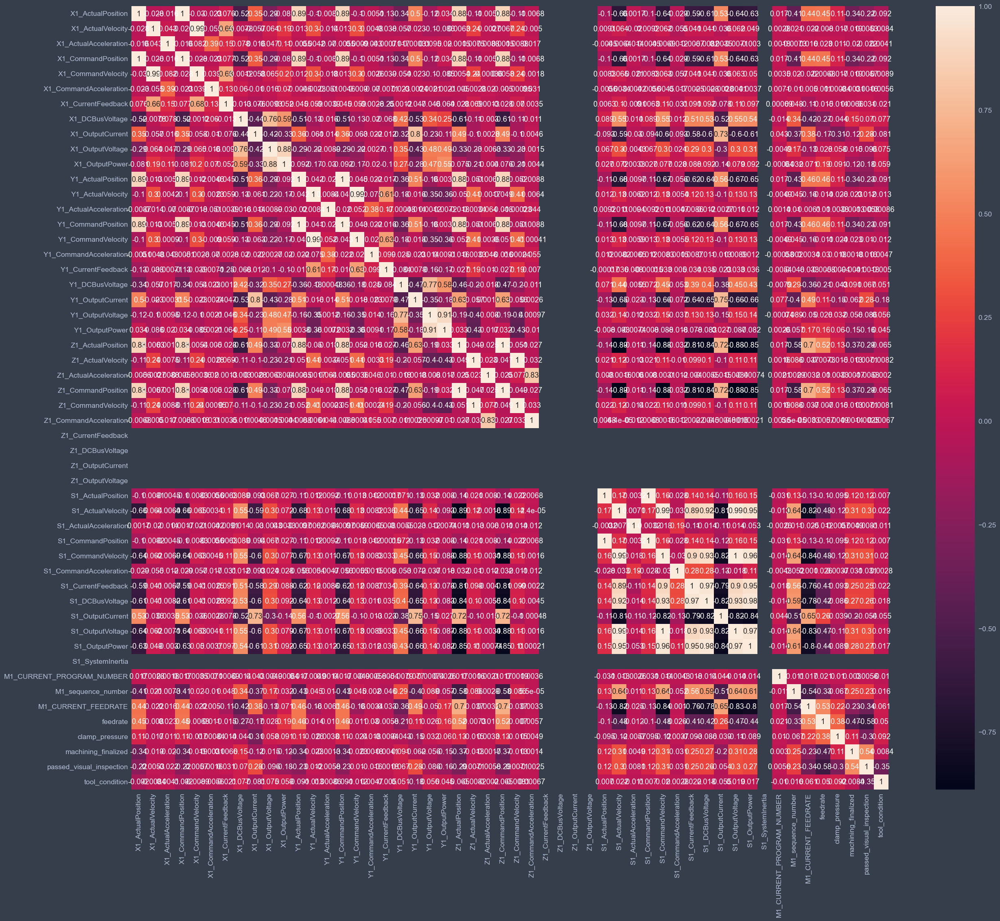

In [18]:
corrmat = df_CNC_full.corr()
plt.figure(figsize = (30, 25))
heatmap_corr = sns.heatmap(corrmat, annot = True)

    We can see that something strange is happening with variables 'Z1_CurrentFeedback', 'Z1_DCBusVoltage', 'Z1_OutputCurrent', 'Z1_OutputVoltage', 'S1_SystemInertia'. So lets try to find out why

In [19]:
df_CNC_full[['Z1_CurrentFeedback', 'Z1_DCBusVoltage', 'Z1_OutputCurrent', 'Z1_OutputVoltage', 'S1_SystemInertia']].value_counts()

Z1_CurrentFeedback  Z1_DCBusVoltage  Z1_OutputCurrent  Z1_OutputVoltage  S1_SystemInertia
0.0                 0.0              0.0               0.0               12.0                25286
dtype: int64

    It seems that variables 'Z1_CurrentFeedback', 'Z1_DCBusVoltage', 'Z1_OutputCurrent', 'Z1_OutputVoltage', 'S1_SystemInertia' are constant ones, having only value 0.0, so we will delete them

In [20]:
df_CNC_full.drop(labels = ['Z1_CurrentFeedback', 'Z1_DCBusVoltage', 'Z1_OutputCurrent', 'Z1_OutputVoltage', 'S1_SystemInertia'], axis = 1, inplace = True)

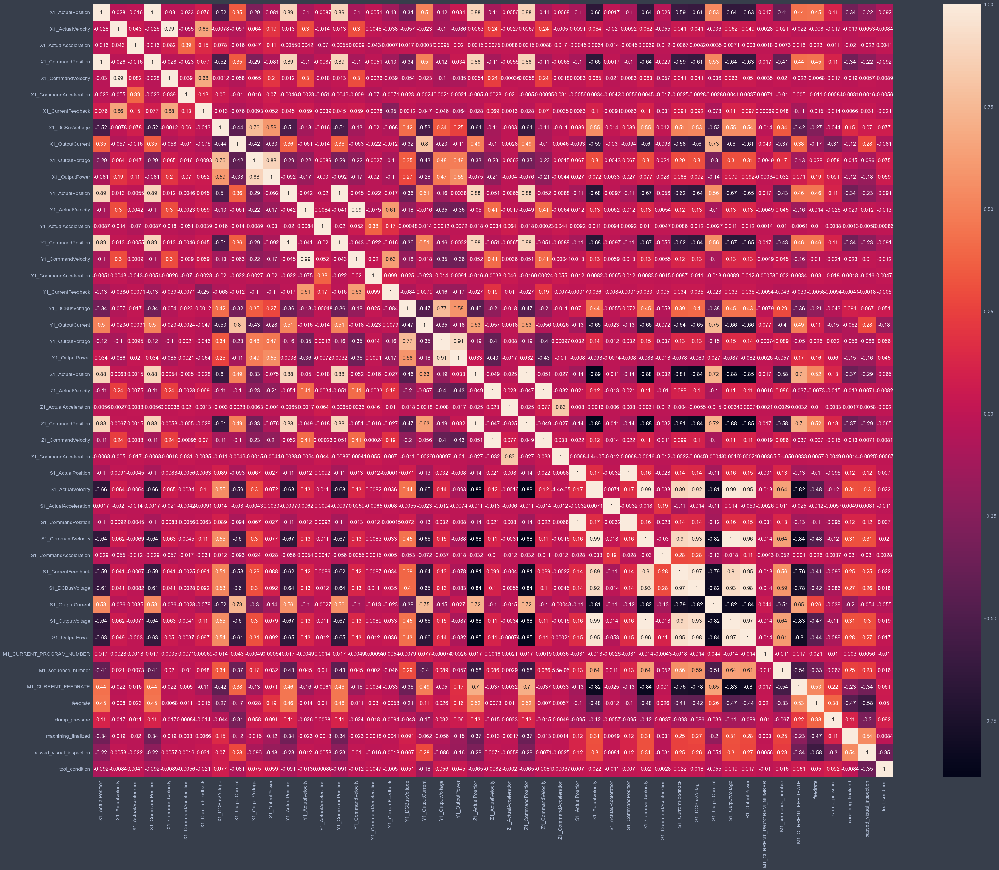

In [21]:
corrmat = df_CNC_full.corr()
plt.figure(figsize = (45, 35))
heatmap_corr = sns.heatmap(corrmat, annot = True)

    Now everything looks fine, It seems that some of the independent variables ad correlated, causing multicoleniarity. We will tackle that problem in feature engineering

# STEP 2: Feature engineering

## Assigning features and target 

In [22]:
df_CNC_full

,X1_ActualPosition,X1_ActualVelocity,X1_ActualAcceleration,X1_CommandPosition,X1_CommandVelocity,X1_CommandAcceleration,X1_CurrentFeedback,X1_DCBusVoltage,X1_OutputCurrent,X1_OutputVoltage,...,M1_CURRENT_PROGRAM_NUMBER,M1_sequence_number,M1_CURRENT_FEEDRATE,Machining_Process,exp_number,feedrate,clamp_pressure,machining_finalized,passed_visual_inspection,tool_condition
0,198.0,0.00,0.00,198.0,0.00,0.000000,0.18,0.0207,329.0,2.77,...,1.0,0.0,50.0,Prep,01,6,4.0,1,1,0
1,198.0,-10.80,-350.00,198.0,-13.60,-358.000000,-10.90,0.1860,328.0,23.30,...,1.0,4.0,50.0,Prep,01,6,4.0,1,1,0
2,196.0,-17.80,-6.25,196.0,-17.90,-0.000095,-8.59,0.1400,328.0,30.60,...,1.0,7.0,50.0,Prep,01,6,4.0,1,1,0
3,194.0,-18.00,0.00,194.0,-17.90,-0.000095,-6.11,0.1300,327.0,30.30,...,1.0,7.0,50.0,Prep,01,6,4.0,1,1,0
4,193.0,-17.90,-18.80,192.0,-17.90,0.000095,-5.70,0.1140,328.0,30.50,...,1.0,7.0,50.0,Prep,01,6,4.0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25281,144.0,-2.30,100.00,144.0,-2.57,0.977000,-5.05,0.0732,327.0,9.56,...,1.0,57.0,3.0,End,18,3,2.5,1,1,1
25282,144.0,-2.47,25.00,144.0,-2.46,1.080000,-5.62,0.0996,327.0,10.30,...,1.0,57.0,3.0,End,18,3,2.5,1,1,1
25283,143.0,-2.20,81.20,143.0,-2.35,1.170000,-4.42,0.0539,327.0,7.79,...,1.0,57.0,3.0,End,18,3,2.5,1,1,1
25284,143.0,-2.05,68.70,143.0,-2.23,1.260000,-5.83,0.0809,327.0,8.32,...,1.0,57.0,3.0,End,18,3,2.5,1,1,1


In [23]:
X = df_CNC_full.drop(labels = ['tool_condition', 'machining_finalized', 'exp_number'], axis = 1)
y_tool_cond = df_CNC_full['tool_condition']
y_machining = df_CNC_full['machining_finalized']
y_visual = df_CNC_full['passed_visual_inspection']

In [24]:
X.shape, y_tool_cond.shape

((25286, 46), (25286,))

In [25]:
X

,X1_ActualPosition,X1_ActualVelocity,X1_ActualAcceleration,X1_CommandPosition,X1_CommandVelocity,X1_CommandAcceleration,X1_CurrentFeedback,X1_DCBusVoltage,X1_OutputCurrent,X1_OutputVoltage,...,S1_OutputCurrent,S1_OutputVoltage,S1_OutputPower,M1_CURRENT_PROGRAM_NUMBER,M1_sequence_number,M1_CURRENT_FEEDRATE,Machining_Process,feedrate,clamp_pressure,passed_visual_inspection
0,198.0,0.00,0.00,198.0,0.00,0.000000,0.18,0.0207,329.0,2.77,...,329.0,0.0,6.960000e-07,1.0,0.0,50.0,Prep,6,4.0,1
1,198.0,-10.80,-350.00,198.0,-13.60,-358.000000,-10.90,0.1860,328.0,23.30,...,328.0,0.0,-5.270000e-07,1.0,4.0,50.0,Prep,6,4.0,1
2,196.0,-17.80,-6.25,196.0,-17.90,-0.000095,-8.59,0.1400,328.0,30.60,...,328.0,0.0,9.100000e-07,1.0,7.0,50.0,Prep,6,4.0,1
3,194.0,-18.00,0.00,194.0,-17.90,-0.000095,-6.11,0.1300,327.0,30.30,...,328.0,0.0,1.070000e-06,1.0,7.0,50.0,Prep,6,4.0,1
4,193.0,-17.90,-18.80,192.0,-17.90,0.000095,-5.70,0.1140,328.0,30.50,...,328.0,0.0,1.960000e-06,1.0,7.0,50.0,Prep,6,4.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25281,144.0,-2.30,100.00,144.0,-2.57,0.977000,-5.05,0.0732,327.0,9.56,...,323.0,118.0,1.580000e-01,1.0,57.0,3.0,End,3,2.5,1
25282,144.0,-2.47,25.00,144.0,-2.46,1.080000,-5.62,0.0996,327.0,10.30,...,320.0,119.0,1.870000e-01,1.0,57.0,3.0,End,3,2.5,1
25283,143.0,-2.20,81.20,143.0,-2.35,1.170000,-4.42,0.0539,327.0,7.79,...,322.0,119.0,1.820000e-01,1.0,57.0,3.0,End,3,2.5,1
25284,143.0,-2.05,68.70,143.0,-2.23,1.260000,-5.83,0.0809,327.0,8.32,...,322.0,118.0,1.820000e-01,1.0,57.0,3.0,End,3,2.5,1


## Encode Machining_Process

In [26]:
X['Machining_Process'].unique()

array(['Prep', 'Layer 1 Up', 'Layer 1 Down', 'Repositioning',
       'Layer 2 Up', 'Layer 2 Down', 'Layer 3 Up', 'Layer 3 Down', 'End'],
      dtype=object)

In [27]:
values = {
    'Prep' : 1,
    'Layer 1 Up' : 2,
    'Layer 1 Down' : 3,
    'Repositioning' : 4,
    'Layer 2 Up' : 5,
    'Layer 2 Down' : 6,
    'Layer 3 Up' : 7,
    'Layer 3 Down' : 8,
    'End' : 9
}

In [28]:
X['Machining_Process'] = X['Machining_Process'].map(values)

In [29]:
X['Machining_Process'].unique()

array([1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=int64)

## Deviding to train and test sets

### Target: tool_condition

In [30]:
X_train_tool, X_test_tool, y_train_tool, y_test_tool = train_test_split(
    X, 
    y_tool_cond,
    test_size = 0.33
)

X_train_tool.shape, X_test_tool.shape

((16941, 46), (8345, 46))

In [31]:
Counter(y_train_tool), Counter(y_test_tool)

(Counter({0: 8039, 1: 8902}), Counter({0: 3939, 1: 4406}))

    tool_condition seems to be relatively balanced

### Target: machining_finalized

In [32]:
X_train_machining, X_test_machining, y_train_machining, y_test_machining = train_test_split(
    X, 
    y_machining, 
    test_size = 0.33 
)

X_train_machining.shape, X_test_machining.shape

((16941, 46), (8345, 46))

In [33]:
Counter(y_train_machining), Counter(y_test_machining)

(Counter({1: 15468, 0: 1473}), Counter({1: 7657, 0: 688}))

    Machining_Process seems to be  not balanced at all

### Target: passed_visual_inspection

In [34]:
X_train_visual, X_test_visual, y_train_visual, y_test_visual = train_test_split(
    X, 
    y_visual,
    test_size = 0.33
)

X_train_visual.shape, X_test_visual.shape

((16941, 46), (8345, 46))

In [35]:
Counter(y_train_visual), Counter(y_test_visual)

(Counter({1: 12887, 0: 4054}), Counter({1: 6296, 0: 2049}))

    passed_visual_inspection seems to be not balanced

## Scaling

### tool_condition set

In [36]:
standart_scaler = StandardScaler()

X_train_tool = standart_scaler.fit_transform(X_train_tool)
X_test_tool = standart_scaler.transform(X_test_tool)

### machining_finalized set

In [37]:
standart_scaler = StandardScaler()

X_train_machining = standart_scaler.fit_transform(X_train_machining)
X_test_machining = standart_scaler.transform(X_test_machining)

### passed_visual_inspection set

In [38]:
standart_scaler = StandardScaler()

X_train_visual = standart_scaler.fit_transform(X_train_visual)
X_test_visual = standart_scaler.transform(X_test_visual)

## Balancing the machining_process and Passed_visual_ispection sets

## machining_process set

### RandomOverSampler

In [39]:
ROS = RandomOverSampler()
X_train_machining_ROS, y_train_machining_ROS = ROS.fit_resample(X_train_machining, y_train_machining)
Counter(y_train_machining_ROS)

Counter({1: 15468, 0: 15468})

### RandomUnderSampler

In [40]:
RUS = RandomUnderSampler()
X_train_machining_RUS, y_train_machining_RUS = RUS.fit_resample(X_train_machining, y_train_machining)
Counter(y_train_machining_RUS)

Counter({0: 1473, 1: 1473})

## passed_visual_inspection set

### RandomOverSampler

In [41]:
ROS = RandomOverSampler()
X_train_visual_ROS, y_train_visual_ROS = ROS.fit_resample(X_train_visual, y_train_visual)
Counter(y_train_visual_ROS)

Counter({1: 12887, 0: 12887})

### RandomUnderSampler

In [42]:
RUS = RandomUnderSampler()
X_train_visual_RUS, y_train_visual_RUS = RUS.fit_resample(X_train_visual, y_train_visual)
Counter(y_train_visual_RUS)

Counter({0: 4054, 1: 4054})

We chose 2 popular ways of balancing dataset to then compare them and choose the best one

# STEP 3: Assigning all the models we will use

In [43]:
RandomForest = RandomForestClassifier()
GradientBoosting = GradientBoostingClassifier()
DecisionTree = DecisionTreeClassifier()
KNeighbors = KNeighborsClassifier()
XGB = XGBClassifier()

models = [RandomForest, GradientBoosting, DecisionTree, KNeighbors, XGB]

# STEP 4: Fitting all the model

## Function for fitting and testing the  balanced models (Balanced)

In [44]:
def fit_test_not_balaced(X_tr_transformed, X_te_transformed, y_tr, y_te, model_list):
    accuracy_train_l = []
    accuracy_test_l = []
    f1_train_l = []
    f1_test_l = []
    for model in model_list:
        model.fit(X_tr_transformed, y_tr)
        preds_train = model.predict(X_tr_transformed)
        preds_test = model.predict(X_te_transformed)
        
        accuracy_train = accuracy_score(y_tr, preds_train)
        accuracy_test = accuracy_score(y_te, preds_test)
        f1_train = f1_score(y_tr, preds_train)
        f1_test = f1_score(y_te, preds_test)
        
        accuracy_train_l.append(accuracy_train)
        accuracy_test_l.append(accuracy_test)
        f1_train_l.append(f1_train)
        f1_test_l.append(f1_test)
        print(model, '\n accuracy(train): {} \n accuracy(test): {} \n'.format(accuracy_train, accuracy_test))
    return accuracy_train_l, accuracy_test_l, f1_train_l, f1_test_l

## Function for fitting and testing the  balanced models (Balanced)

In [45]:
def fit_test_balanced(X_tr_transformed, X_tr_balanced, X_te_transformed, y_tr, y_tr_balanced, y_te, model_list):
    accuracy_train_l = []
    accuracy_test_l = []
    f1_train_l = []
    f1_test_l = []
    for model in model_list:
        model.fit(X_tr_balanced, y_tr_balanced)
        preds_train = model.predict(X_tr_transformed)
        preds_test = model.predict(X_te_transformed)
        
        accuracy_train = accuracy_score(y_tr, preds_train)
        accuracy_test = accuracy_score(y_te, preds_test)
        f1_train = f1_score(y_tr, preds_train)
        f1_test = f1_score(y_te, preds_test)
        
        accuracy_train_l.append(accuracy_train)
        accuracy_test_l.append(accuracy_test)
        f1_train_l.append(f1_train)
        f1_test_l.append(f1_test)
        print(model, '\n accuracy(train): {} \n accuracy(test): {} \n'.format(accuracy_train, accuracy_test))
    return accuracy_train_l, accuracy_test_l, f1_train_l, f1_test_l

## Target: tool_condition

In [46]:
accuracy_train_tool, accuracy_test_tool, f1_train_tool, f1_test_tool = fit_test_not_balaced(
    X_train_tool,
    X_test_tool,
    y_train_tool,
    y_test_tool,
    models
)

RandomForestClassifier() 
 accuracy(train): 1.0 
 accuracy(test): 0.9942480527261833 

GradientBoostingClassifier() 
 accuracy(train): 0.9904964287822443 
 accuracy(test): 0.988016776512882 

DecisionTreeClassifier() 
 accuracy(train): 1.0 
 accuracy(test): 0.9911324146195326 

KNeighborsClassifier() 
 accuracy(train): 0.9292839855970721 
 accuracy(test): 0.8751348112642301 

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, pr

## Target: machining_finalized

### RandomOverSampler

In [47]:
accuracy_train_machining_ROS, accuracy_test_machining_ROS, f1_train_machining_ROS, f1_test_machining_ROS = fit_test_balanced(
    X_train_machining,
    X_train_machining_ROS,
    X_test_machining,
    y_train_machining,
    y_train_machining_ROS,
    y_test_machining,
    models
)

RandomForestClassifier() 
 accuracy(train): 1.0 
 accuracy(test): 1.0 

GradientBoostingClassifier() 
 accuracy(train): 0.9993506876807745 
 accuracy(test): 0.9978430197723187 

DecisionTreeClassifier() 
 accuracy(train): 1.0 
 accuracy(test): 0.9997603355302577 

KNeighborsClassifier() 
 accuracy(train): 0.9914408830647542 
 accuracy(test): 0.9841821449970042 

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto'

### RandomUnderSampler

In [48]:
accuracy_train_machining_RUS, accuracy_test_machining_RUS, f1_train_machining_RUS, f1_test_machining_RUS = fit_test_balanced(
    X_train_machining,
    X_train_machining_RUS,
    X_test_machining,
    y_train_machining,
    y_train_machining_RUS,
    y_test_machining,
    models
)

RandomForestClassifier() 
 accuracy(train): 0.9958089841213624 
 accuracy(test): 0.9947273816656681 

GradientBoostingClassifier() 
 accuracy(train): 0.9992916592881176 
 accuracy(test): 0.9990413421210306 

DecisionTreeClassifier() 
 accuracy(train): 0.9985833185762352 
 accuracy(test): 0.9974835230677052 

KNeighborsClassifier() 
 accuracy(train): 0.955728705507349 
 accuracy(test): 0.9484721390053924 

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_j

### Without balancing

In [49]:
accuracy_train_machining, accuracy_test_machining, f1_train_machining, f1_test_machining = fit_test_not_balaced(
    X_train_tool,
    X_test_tool,
    y_train_tool,
    y_test_tool,
    models
)

RandomForestClassifier() 
 accuracy(train): 1.0 
 accuracy(test): 0.9950868783702816 

GradientBoostingClassifier() 
 accuracy(train): 0.9904964287822443 
 accuracy(test): 0.988016776512882 

DecisionTreeClassifier() 
 accuracy(train): 1.0 
 accuracy(test): 0.9904134212103056 

KNeighborsClassifier() 
 accuracy(train): 0.9292839855970721 
 accuracy(test): 0.8751348112642301 

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, pr

## Target: passed_visual_inspection

### RandomOverSampler

In [50]:
accuracy_train_visual_ROS, accuracy_test_visual_ROS, f1_train_visual_ROS, f1_test_visual_ROS = fit_test_balanced(
    X_train_visual,
    X_train_visual_ROS,
    X_test_visual,
    y_train_visual,
    y_train_visual_ROS,
    y_test_visual,
    models
)

RandomForestClassifier() 
 accuracy(train): 1.0 
 accuracy(test): 1.0 

GradientBoostingClassifier() 
 accuracy(train): 1.0 
 accuracy(test): 1.0 

DecisionTreeClassifier() 
 accuracy(train): 1.0 
 accuracy(test): 1.0 

KNeighborsClassifier() 
 accuracy(train): 0.993329791629774 
 accuracy(test): 0.9907729179149191 

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, r

### RandomUnderSampler

In [51]:
accuracy_train_visual_RUS, accuracy_test_visual_RUS, f1_train_visual_RUS, f1_test_visual_RUS = fit_test_balanced(
    X_train_visual,    
    X_train_visual_RUS,
    X_test_visual,
    y_train_visual,
    y_train_visual_RUS,
    y_test_visual,
    models
)

RandomForestClassifier() 
 accuracy(train): 1.0 
 accuracy(test): 1.0 

GradientBoostingClassifier() 
 accuracy(train): 1.0 
 accuracy(test): 1.0 

DecisionTreeClassifier() 
 accuracy(train): 1.0 
 accuracy(test): 1.0 

KNeighborsClassifier() 
 accuracy(train): 0.9886075202172245 
 accuracy(test): 0.9872977831036549 

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, 

### Without balancing

In [52]:
accuracy_train_visual, accuracy_test_visual, f1_train_visual, f1_test_visual = fit_test_not_balaced(
    X_train_visual,
    X_test_visual,
    y_train_visual,
    y_test_visual,
    models
)

RandomForestClassifier() 
 accuracy(train): 1.0 
 accuracy(test): 1.0 

GradientBoostingClassifier() 
 accuracy(train): 1.0 
 accuracy(test): 1.0 

DecisionTreeClassifier() 
 accuracy(train): 1.0 
 accuracy(test): 1.0 

KNeighborsClassifier() 
 accuracy(train): 0.99510064340948 
 accuracy(test): 0.9922109047333733 

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, re

# STEP 5: Result analysis

## Function for result analysis

In [53]:
def table_result(accuracy_train, accuracy_test, f1_train, f1_test, models):
    df = pd.DataFrame({
        'models': models,
        'accuracy_train_set': accuracy_train,
        'accuracy_test_set': accuracy_test,
        'f1_score_train_set': f1_train,
        'f1_score_test_set': f1_test
    }).sort_values(by = 'accuracy_test_set', ascending = False)
    df.reset_index(drop = 'index')
    return df

## target: tool_condition

In [54]:
model_names = ['RandomForest', 'GradientBoost', 'DecistionTree', 'KNeighbors', 'XGB',]

In [55]:
result_tools = table_result(
    accuracy_train_tool,
    accuracy_test_tool,
    f1_train_tool,
    f1_test_tool,
    model_names
)
result_tools.style.set_caption("Tool_condion").set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'white'),
        ('font-size', '16px'),
        ("text-align", "center")
    ]
}])

,models,accuracy_train_set,accuracy_test_set,f1_score_train_set,f1_score_test_set
4,XGB,1.000000,0.996765,1.000000,0.996934
0,RandomForest,1.000000,0.994248,1.000000,0.994549
2,DecistionTree,1.000000,0.991132,1.000000,0.991610
1,GradientBoost,0.990496,0.988017,0.990979,0.988688
3,KNeighbors,0.929284,0.875135,0.932953,0.881806


    We will take only XGB, RandomForest and DecisionTree models for predicting tool_condition because they give the best performances without any causes of overfitting

## Target: machining_finalized

### RandomOverSampler

In [56]:
result_machining_ROS = table_result(
    accuracy_train_machining_ROS, 
    accuracy_test_machining_ROS,
    f1_train_machining_ROS,
    f1_test_machining_ROS,
    model_names
)
result_machining_ROS.style.set_caption("Machining_Process (ROS)").set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'white'),
        ('font-size', '16px'),
        ("text-align", "center")
    ]
}])

,models,accuracy_train_set,accuracy_test_set,f1_score_train_set,f1_score_test_set
0,RandomForest,1.000000,1.000000,1.000000,1.000000
4,XGB,1.000000,1.000000,1.000000,1.000000
2,DecistionTree,1.000000,0.999760,1.000000,0.999869
1,GradientBoost,0.999351,0.997843,0.999644,0.998823
3,KNeighbors,0.991441,0.984182,0.995291,0.991328


### RandomUnderSampler

In [57]:
result_machining_RUS = table_result(
    accuracy_train_machining_RUS,
    accuracy_test_machining_RUS,
    f1_train_machining_RUS,
    f1_test_machining_RUS,
    model_names
)
result_machining_RUS.style.set_caption("Machining_Process (RUS)").set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'white'),
        ('font-size', '16px'),
        ("text-align", "center")
    ]
}])

,models,accuracy_train_set,accuracy_test_set,f1_score_train_set,f1_score_test_set
4,XGB,0.999233,0.999161,0.999580,0.999543
1,GradientBoost,0.999292,0.999041,0.999612,0.999477
2,DecistionTree,0.998583,0.997484,0.999224,0.998627
0,RandomForest,0.995809,0.994727,0.997700,0.997119
3,KNeighbors,0.955729,0.948472,0.975175,0.971183


### Without balancing

In [58]:
result_machining = table_result(
    accuracy_train_machining,
    accuracy_test_machining,
    f1_train_machining,
    f1_test_machining,
    model_names
)
result_machining.style.set_caption("Machining_Process").set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'white'),
        ('font-size', '16px'),
        ("text-align", "center")
    ]
}])

,models,accuracy_train_set,accuracy_test_set,f1_score_train_set,f1_score_test_set
4,XGB,1.000000,0.996765,1.000000,0.996934
0,RandomForest,1.000000,0.995087,1.000000,0.995348
2,DecistionTree,1.000000,0.990413,1.000000,0.990936
1,GradientBoost,0.990496,0.988017,0.990979,0.988688
3,KNeighbors,0.929284,0.875135,0.932953,0.881806


    It seems that the models trained on data balanced by RandomOverSampler give the best performances without any causes of overfitting

    This is why we will use RandomOverSampler for balancing the dataset and DecisionThree, XGB, RandomForest models to predict target 'Machining_process'

## target: passed_visual_inspection

### RandomOverSampler

In [59]:
result_machining_ROS = table_result(
    accuracy_train_visual_ROS, 
    accuracy_test_visual_ROS,
    f1_train_visual_ROS,
    f1_test_visual_ROS,
    model_names
)
result_machining_ROS.style.set_caption("passed_visual_inspection (ROS)").set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'white'),
        ('font-size', '16px'),
        ("text-align", "center")
    ]
}])

,models,accuracy_train_set,accuracy_test_set,f1_score_train_set,f1_score_test_set
0,RandomForest,1.000000,1.000000,1.000000,1.000000
1,GradientBoost,1.000000,1.000000,1.000000,1.000000
2,DecistionTree,1.000000,1.000000,1.000000,1.000000
4,XGB,1.000000,1.000000,1.000000,1.000000
3,KNeighbors,0.993330,0.990773,0.995599,0.993856


### RandomUnderSampler

In [60]:
result_machining_RUS = table_result(
    accuracy_train_visual_RUS, 
    accuracy_test_visual_RUS,
    f1_train_visual_RUS,
    f1_test_visual_RUS,
    model_names
)
result_machining_RUS.style.set_caption("passed_visual_inspection (RUS)").set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'white'),
        ('font-size', '16px'),
        ("text-align", "center")
    ]
}])

,models,accuracy_train_set,accuracy_test_set,f1_score_train_set,f1_score_test_set
0,RandomForest,1.000000,1.000000,1.000000,1.000000
1,GradientBoost,1.000000,1.000000,1.000000,1.000000
2,DecistionTree,1.000000,1.000000,1.000000,1.000000
4,XGB,1.000000,1.000000,1.000000,1.000000
3,KNeighbors,0.988608,0.987298,0.992459,0.991521


### Without balancing

In [61]:
result_machining = table_result(
    accuracy_train_visual, 
    accuracy_test_visual,
    f1_train_visual,
    f1_test_visual,
    model_names
)
result_machining.style.set_caption("passed_visual_inspection").set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'white'),
        ('font-size', '16px'),
        ("text-align", "center")
    ]
}])

,models,accuracy_train_set,accuracy_test_set,f1_score_train_set,f1_score_test_set
0,RandomForest,1.000000,1.000000,1.000000,1.000000
1,GradientBoost,1.000000,1.000000,1.000000,1.000000
2,DecistionTree,1.000000,1.000000,1.000000,1.000000
4,XGB,1.000000,1.000000,1.000000,1.000000
3,KNeighbors,0.995101,0.992211,0.996781,0.994851


    It seems that the models works equally well on both balanced and not balanced datasets and give the high performances without any causes of overfitting

    This is why we will use not balanced datset and DecisionThree, XGB, RandomForest models to predict target 'passed_visual_inspection'


# STEP 6: Cross-validation of shortlist models

## Function for cross-validation

In [62]:
def cross_validation(model_list, X_tr, y_tr, cv):
    score_mean = []
    std_list = []
    for model in model_list:
        scores = cross_val_score(model, X_tr, y_tr, cv = cv, scoring = 'accuracy')
        mean = scores.mean()
        std = scores.std()
        score_mean.append(mean)
        std_list.append(std)
        print(model, '\n mean score: {} \n std: {}'.format(mean, std))
        
    return score_mean, std_list

## Function for CV result analysis

In [63]:
def table_result_CV(mean, std, models_name):
    df = pd.DataFrame({
        'Models': models_name,
        'Mean': mean,
        'Std': std,
    }).sort_values(by = 'Mean', ascending = False)
    df.reset_index(drop = 'index')
    return df

## Target: tool_condition

In [64]:
XGB = XGBClassifier()
RandomForest = RandomForestClassifier() 
DecisionTree = DecisionTreeClassifier()
models_tool = [XGB, RandomForest, DecisionTree]
models_tool_name = ['XGB', 'RandomForest', 'DecistionTree']

mean_scores_tool, std_scores_tool = cross_validation(models_tool, X_train_tool, y_train_tool, 10)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, gamma=None,
              gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=None,
              reg_alpha=None, reg_lambda=None, ...) 
 mean score: 0.996576360084003 
 std: 0.0012039984479243872
RandomForestClassifier() 
 mean score: 0.9944513866396409 
 std: 0.0016943205021873054
DecisionTreeClassifier() 
 mean score: 0.9910278163777761 
 std: 0.0024447674138693104


In [65]:
results_tool_cv = table_result_CV(mean_scores_tool, std_scores_tool, models_tool_name)
results_tool_cv.style.set_caption("tool_condition").set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'white'),
        ('font-size', '16px'),
        ("text-align", "center")
    ]
}])

,Models,Mean,Std
0,XGB,0.996576,0.001204
1,RandomForest,0.994451,0.001694
2,DecistionTree,0.991028,0.002445


## Target: machining_finalized

In [66]:
DecisionTree = DecisionTreeClassifier()
XGB = XGBClassifier()
RandomForest = RandomForestClassifier() 
models_machining = [DecisionTree, XGB, RandomForest]
models_machining_name = ['DecisionTree', 'XGB', 'RandomForest']

mean_scores_machining, std_scores__machining = cross_validation(models_machining, X_train_machining_ROS, y_train_machining_ROS, 10)

DecisionTreeClassifier() 
 mean score: 0.9998706757193663 
 std: 0.00025864856126736054
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, gamma=None,
              gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=None,
              reg_alpha=None, reg_lambda=None, ...) 
 mean score: 0.9998706757193663 
 std: 0.00025864856126736054
RandomForestClassifier() 
 mean score: 0.9998706757193663 
 std: 0.00029631915259980727


In [67]:
results_tool_cv = table_result_CV(mean_scores_machining, std_scores__machining, models_machining_name)
results_tool_cv.style.set_caption("machining_process").set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'white'),
        ('font-size', '16px'),
        ("text-align", "center")
    ]
}])

,Models,Mean,Std
0,DecisionTree,0.999871,0.000259
1,XGB,0.999871,0.000259
2,RandomForest,0.999871,0.000296


## Target: passed_visual_inspection

In [68]:
DecisionTree = DecisionTreeClassifier()
XGB = XGBClassifier()
RandomForest = RandomForestClassifier() 
models_visual = [DecisionTree, XGB, RandomForest]
models_visual_names = ['DecisionTree', 'XGB', 'RandomForest']

mean_scores_visual, std_scores__visual = cross_validation(models_visual, X_train_visual, y_train_visual, 10)

DecisionTreeClassifier() 
 mean score: 1.0 
 std: 0.0
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, gamma=None,
              gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=None,
              reg_alpha=None, reg_lambda=None, ...) 
 mean score: 1.0 
 std: 0.0
RandomForestClassifier() 
 mean score: 1.0 
 std: 0.0


In [69]:
results_tool_cv = table_result_CV(mean_scores_visual, std_scores__visual, models_visual_names)
results_tool_cv.style.set_caption("passed_visual_inspection").set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'white'),
        ('font-size', '16px'),
        ("text-align", "center")
    ]
}])

,Models,Mean,Std
0,DecisionTree,1.000000,0.000000
1,XGB,1.000000,0.000000
2,RandomForest,1.000000,0.000000


# STEP 7: fine-tuning hyperparametres using RandomizedSearchCV

In randomizedsearchcv, instead of providing a discrete set of values to explore on each hyperparameter, we provide a statistical distribution or list of hyper parameters. Values for the different hyper parameters are picked up at random from this distribution. 

## Function for RandomizedSearchCV

In [70]:
def RandomSeacrhCV(model, params, cv, scoring):
    RandomSearch = RandomizedSearchCV(
                model,
                param_distributions = params,
                cv = cv, 
                scoring = scoring,
                verbose = 2,
                n_jobs = -1,
                return_train_score = True
             )
    return RandomSearch

## Target: tool_condition

In [71]:
XGB = XGBClassifier()
RandomForest = RandomForestClassifier() 
DecisionTree = DecisionTreeClassifier()
models_tool = [XGB, RandomForest, DecisionTree]

### XGB

In [72]:
randomSearch_params_XGB = {
    'n_estimators': [300, 500],
    'learning_rate': [0.001, 0.01],
    'subsample': [0.5, 0.7],
}

XGB_random_search = RandomSeacrhCV(XGB, randomSearch_params_XGB, 10, 'accuracy')
XGB_random_search.fit(X_train_tool, y_train_tool)
XGB_best_params_tool = XGB_random_search.best_params_
print('Best hyperparametres for XGB (tool): {} \naccuracy: {}\n'.format(XGB_best_params_tool, XGB_random_search.best_score_))

D:\Anaconda\envs\KV_DW_JL_5\lib\site-packages\sklearn\model_selection\_search.py:296: UserWarning:

The total space of parameters 8 is smaller than n_iter=10. Running 8 iterations. For exhaustive searches, use GridSearchCV.



Fitting 10 folds for each of 8 candidates, totalling 80 fits
Best hyperparametres for XGB (tool): {'subsample': 0.7, 'n_estimators': 500, 'learning_rate': 0.01} 
accuracy: 0.9913817986786612



### RandomForest

In [73]:
randomSearch_params_RandomForest = {
    'n_estimators': [300, 500, 700],
    'criterion': ["gini", "entropy"],
    'max_features': ["sqrt", "log2", None],
}

RandomForest_random_search = RandomSeacrhCV(RandomForest, randomSearch_params_RandomForest, 10, 'accuracy')
RandomForest_random_search.fit(X_train_tool, y_train_tool)
RandomForest_best_params_tool = RandomForest_random_search.best_params_
print('Best hyperparametres for RandomForest (tool): {} \naccuracy: {}\n'.format(RandomForest_best_params_tool, RandomForest_random_search.best_score_))

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Best hyperparametres for RandomForest (tool): {'n_estimators': 500, 'max_features': 'log2', 'criterion': 'entropy'} 
accuracy: 0.9952187313892866



### DecisionTree

In [75]:
randomSearch_params_DecisionTree = {
    'criterion': ["gini", "entropy"],
    'splitter': ["best", "random"],
    'max_depth': [4, 6, 8, 10]
}

DecistionTree_random_search = RandomSeacrhCV(DecisionTree, randomSearch_params_DecisionTree, 10, 'accuracy')
DecistionTree_random_search.fit(X_train_tool, y_train_tool)
DecistionTree_best_params_tool = DecistionTree_random_search.best_params_
print('Best hyperparametres for DecistionTree (tool): {} \naccuracy: {}\n'.format(DecistionTree_best_params_tool, DecistionTree_random_search.best_score_))

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Best hyperparametres for DecistionTree (tool): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'} 
accuracy: 0.9562597123980874



## Target: machining_finalized

In [76]:
XGB = XGBClassifier()
RandomForest = RandomForestClassifier() 
DecisionTree = DecisionTreeClassifier()
models_tool = [XGB, RandomForest, DecisionTree]

### XGB

In [77]:
randomSearch_params_XGB = {
    'n_estimators': [300, 500],
    'learning_rate': [0.001, 0.01],
    'subsample': [0.5, 0.7],
}

XGB_random_search = RandomSeacrhCV(XGB, randomSearch_params_XGB, 10, 'accuracy')
XGB_random_search.fit(X_train_machining_ROS, y_train_machining_ROS)
XGB_best_params_machining = XGB_random_search.best_params_
print('Best hyperparametres for XGB (machining): {} \naccuracy: {}\n'.format(XGB_best_params_machining, XGB_random_search.best_score_))

D:\Anaconda\envs\KV_DW_JL_5\lib\site-packages\sklearn\model_selection\_search.py:296: UserWarning:

The total space of parameters 8 is smaller than n_iter=10. Running 8 iterations. For exhaustive searches, use GridSearchCV.



Fitting 10 folds for each of 8 candidates, totalling 80 fits
Best hyperparametres for XGB (machining): {'subsample': 0.5, 'n_estimators': 500, 'learning_rate': 0.01} 
accuracy: 0.9998706757193663



### RandomForest

In [78]:
randomSearch_params_RandomForest = {
    'n_estimators': [300, 500, 700],
    'criterion': ["gini", "entropy"],
    'max_features': ["sqrt", "log2", None],
}

RandomForest_random_search = RandomSeacrhCV(RandomForest, randomSearch_params_RandomForest, 10, 'accuracy')
RandomForest_random_search.fit(X_train_machining_ROS, y_train_machining_ROS)
RandomForest_best_params_machining = RandomForest_random_search.best_params_
print('Best hyperparametres for RandomForest (machining): {} \naccuracy: {}\n'.format(RandomForest_best_params_machining, RandomForest_random_search.best_score_))

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Best hyperparametres for RandomForest (machining): {'n_estimators': 700, 'max_features': 'sqrt', 'criterion': 'entropy'} 
accuracy: 0.9999030172391272



### DecisionTree

In [79]:
randomSearch_params_DecisionTree = {
    'criterion': ["gini", "entropy"],
    'splitter': ["best", "random"],
    'max_depth': [4, 6, 8, 10]
}

DecistionTree_random_search = RandomSeacrhCV(DecisionTree, randomSearch_params_DecisionTree, 10, 'accuracy')
DecistionTree_random_search.fit(X_train_machining_ROS, y_train_machining_ROS)
DecistionTree_best_params_machining = DecistionTree_random_search.best_params_
print('Best hyperparametres for DecistionTree (machining): {} \naccuracy: {}\n'.format(DecistionTree_best_params_machining, DecistionTree_random_search.best_score_))

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Best hyperparametres for DecistionTree (machining): {'splitter': 'best', 'max_depth': 8, 'criterion': 'entropy'} 
accuracy: 0.9998706757193663



## Target: passed_visual_inspection

### XGB

In [80]:
randomSearch_params_XGB = {
    'n_estimators': [300, 500],
    'learning_rate': [0.001, 0.01],
    'subsample': [0.5, 0.7],
}

XGB_random_search = RandomSeacrhCV(XGB, randomSearch_params_XGB, 10, 'accuracy')
XGB_random_search.fit(X_train_visual, y_train_visual)
XGB_best_params_visual = XGB_random_search.best_params_
print('Best hyperparametres for XGB (visual): {} \naccuracy: {}\n'.format(XGB_best_params_visual, XGB_random_search.best_score_))

Fitting 10 folds for each of 8 candidates, totalling 80 fits


D:\Anaconda\envs\KV_DW_JL_5\lib\site-packages\sklearn\model_selection\_search.py:296: UserWarning:

The total space of parameters 8 is smaller than n_iter=10. Running 8 iterations. For exhaustive searches, use GridSearchCV.



Best hyperparametres for XGB (visual): {'subsample': 0.5, 'n_estimators': 300, 'learning_rate': 0.001} 
accuracy: 1.0



### RandomForest

In [81]:
randomSearch_params_RandomForest = {
    'n_estimators': [300, 500, 700],
    'criterion': ["gini", "entropy"],
    'max_features': ["sqrt", "log2", None],
}

RandomForest_random_search = RandomSeacrhCV(RandomForest, randomSearch_params_RandomForest, 10, 'accuracy')
RandomForest_random_search.fit(X_train_visual, y_train_visual)
RandomForest_best_params_visual = RandomForest_random_search.best_params_
print('Best hyperparametres for RandomForest (visual): {} \naccuracy: {}\n'.format(RandomForest_best_params_visual, RandomForest_random_search.best_score_))

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Best hyperparametres for RandomForest (visual): {'n_estimators': 300, 'max_features': 'log2', 'criterion': 'gini'} 
accuracy: 1.0



### DecisionTree

In [82]:
randomSearch_params_DecisionTree = {
    'criterion': ["gini", "entropy"],
    'splitter': ["best", "random"],
    'max_depth': [4, 6, 8, 10]
}

DecistionTree_random_search = RandomSeacrhCV(DecisionTree, randomSearch_params_DecisionTree, 10, 'accuracy')
DecistionTree_random_search.fit(X_train_visual, y_train_visual)
DecistionTree_best_params_visual = DecistionTree_random_search.best_params_
print('Best hyperparametres for DecistionTree (visual): {} \naccuracy: {}\n'.format(DecistionTree_best_params_visual, DecistionTree_random_search.best_score_))

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Best hyperparametres for DecistionTree (visual): {'splitter': 'best', 'max_depth': 4, 'criterion': 'gini'} 
accuracy: 1.0



# STEP 8: Result analysis of Models with tuned hyperparametres

## Tuned models

### Target: tool_condition

In [83]:
XGB_tool = XGBClassifier(
    n_estimators = XGB_best_params_tool['n_estimators'],
    learning_rate = XGB_best_params_tool['learning_rate'],
    subsample = XGB_best_params_tool['subsample'],
)

RandomForest_tool = RandomForestClassifier(
    n_estimators = RandomForest_best_params_tool['n_estimators'],
    criterion = RandomForest_best_params_tool['criterion'],
    max_features = RandomForest_best_params_tool['max_features'],
)

DecisionTree_tool = DecisionTreeClassifier(
    splitter = DecistionTree_best_params_tool['splitter'],
    max_depth = DecistionTree_best_params_tool['max_depth'],
    criterion = DecistionTree_best_params_tool['criterion']
)

models_tool = {
    'XGB_tool': XGB_tool,
    'RandomForest_tool': RandomForest_tool,
    'DecisionTree_tool': DecisionTree_tool
}

# fitting the models
for model in models_tool.values():
    model.fit(X_train_tool, y_train_tool)

### Target: machining_finalized

In [84]:
XGB_machining = XGBClassifier(
    n_estimators = XGB_best_params_machining['n_estimators'],
    learning_rate = XGB_best_params_machining['learning_rate'],
    subsample = XGB_best_params_machining['subsample'],
)

RandomForest_machining = RandomForestClassifier(
    n_estimators = RandomForest_best_params_machining['n_estimators'],
    criterion = RandomForest_best_params_machining['criterion'],
    max_features = RandomForest_best_params_machining['max_features'],
)

DecisionTree_machining = DecisionTreeClassifier(
    splitter = DecistionTree_best_params_machining['splitter'],
    max_depth = DecistionTree_best_params_machining['max_depth'],
    criterion = DecistionTree_best_params_machining['criterion']
)

models_machining = {
    'XGB_machining': XGB_machining,
    'RandomForest_machining': RandomForest_machining,
    'DecisionTree_machining': DecisionTree_machining
}

# fitting the models
for model in models_machining.values():
    model.fit(X_train_machining_ROS, y_train_machining_ROS)

### Target: passed_visual_inspection

In [85]:
XGB_visual = XGBClassifier(
    n_estimators = XGB_best_params_visual['n_estimators'],
    learning_rate = XGB_best_params_visual['learning_rate'],
    subsample = XGB_best_params_visual['subsample'],
)

RandomForest_visual = RandomForestClassifier(
    n_estimators = RandomForest_best_params_visual['n_estimators'],
    criterion = RandomForest_best_params_visual['criterion'],
    max_features = RandomForest_best_params_visual['max_features'],
)

DecisionTree_visual = DecisionTreeClassifier(
    splitter = DecistionTree_best_params_visual['splitter'],
    max_depth = DecistionTree_best_params_visual['max_depth'],
    criterion = DecistionTree_best_params_visual['criterion']
)

models_visual = {
    'XGB_visual': XGB_visual,
    'RandomForest_visual': RandomForest_visual,
    'DecisionTree_visual': DecisionTree_visual
}

# fitting the models
for model in models_visual.values():
    model.fit(X_train_visual, y_train_visual)

## Predictions of tuned models

### Target: tool_condition

In [86]:
train_preds_tool = {}
train_preds_proba_tool = {}
test_preds_tool = {}
test_preds_proba_tool = {}

for name, model in models_tool.items():
    train_preds_tool[name] = model.predict(X_train_tool)
    train_preds_proba_tool[name] = model.predict_proba(X_train_tool)
    test_preds_tool[name] = model.predict(X_test_tool)
    test_preds_proba_tool[name] = model.predict_proba(X_test_tool)
    
train_preds_tool, train_preds_proba_tool

({'XGB_tool': array([0, 1, 0, ..., 1, 0, 0]),
  'RandomForest_tool': array([0, 1, 0, ..., 1, 0, 0], dtype=int64),
  'DecisionTree_tool': array([0, 1, 0, ..., 1, 0, 0], dtype=int64)},
 {'XGB_tool': array([[0.9016538 , 0.09834619],
         [0.0128634 , 0.9871366 ],
         [0.910656  , 0.08934405],
         ...,
         [0.04093587, 0.9590641 ],
         [0.97218955, 0.02781046],
         [0.9807075 , 0.01929246]], dtype=float32),
  'RandomForest_tool': array([[0.996, 0.004],
         [0.   , 1.   ],
         [0.998, 0.002],
         ...,
         [0.014, 0.986],
         [0.946, 0.054],
         [0.996, 0.004]]),
  'DecisionTree_tool': array([[0.79285714, 0.20714286],
         [0.        , 1.        ],
         [0.79285714, 0.20714286],
         ...,
         [0.        , 1.        ],
         [1.        , 0.        ],
         [1.        , 0.        ]])})

### Target: machining_finalized

In [87]:
train_preds_machining = {}
train_preds_proba_machining = {}
test_preds_machining = {}
test_preds_proba_machining = {}

for name, model in models_machining.items():
    train_preds_machining[name] = model.predict(X_train_machining)
    train_preds_proba_machining[name] = model.predict_proba(X_train_machining)
    test_preds_machining[name] = model.predict(X_test_machining)
    test_preds_proba_machining[name] = model.predict_proba(X_test_machining)
    
train_preds_machining, train_preds_proba_machining

({'XGB_machining': array([1, 1, 1, ..., 1, 1, 1]),
  'RandomForest_machining': array([1, 1, 1, ..., 1, 1, 1], dtype=int64),
  'DecisionTree_machining': array([1, 1, 1, ..., 1, 1, 1], dtype=int64)},
 {'XGB_machining': array([[0.00351018, 0.9964898 ],
         [0.00351018, 0.9964898 ],
         [0.00351018, 0.9964898 ],
         ...,
         [0.00351018, 0.9964898 ],
         [0.00351018, 0.9964898 ],
         [0.00408071, 0.9959193 ]], dtype=float32),
  'RandomForest_machining': array([[0.00142857, 0.99857143],
         [0.        , 1.        ],
         [0.        , 1.        ],
         ...,
         [0.        , 1.        ],
         [0.        , 1.        ],
         [0.        , 1.        ]]),
  'DecisionTree_machining': array([[0., 1.],
         [0., 1.],
         [0., 1.],
         ...,
         [0., 1.],
         [0., 1.],
         [0., 1.]])})

### Target: passed_visual_inspection

In [88]:
train_preds_visual = {}
train_preds_proba_visual = {}
test_preds_visual = {}
test_preds_proba_visual = {}

for name, model in models_visual.items():
    train_preds_visual[name] = model.predict(X_train_visual)
    train_preds_proba_visual[name] = model.predict_proba(X_train_visual)
    test_preds_visual[name] = model.predict(X_test_visual)
    test_preds_proba_visual[name] = model.predict_proba(X_test_visual)
    
train_preds_visual, train_preds_proba_visual

({'XGB_visual': array([1, 1, 1, ..., 1, 1, 1]),
  'RandomForest_visual': array([1, 1, 1, ..., 1, 1, 1], dtype=int64),
  'DecisionTree_visual': array([1, 1, 1, ..., 1, 1, 1], dtype=int64)},
 {'XGB_visual': array([[0.37043715, 0.62956285],
         [0.37043715, 0.62956285],
         [0.37043715, 0.62956285],
         ...,
         [0.37043715, 0.62956285],
         [0.37043715, 0.62956285],
         [0.37043715, 0.62956285]], dtype=float32),
  'RandomForest_visual': array([[0., 1.],
         [0., 1.],
         [0., 1.],
         ...,
         [0., 1.],
         [0., 1.],
         [0., 1.]]),
  'DecisionTree_visual': array([[0., 1.],
         [0., 1.],
         [0., 1.],
         ...,
         [0., 1.],
         [0., 1.],
         [0., 1.]])})

## Confusion matrix

### Function to draw matrix

In [89]:
def draw_confusion_matrix(models, y_tr, y_te, train_pred, test_pred):
    for name, result in models.items():
        f, axes = plt.subplots(1, 2, figsize=(15, 6), sharey='row')
        
        for i in range(2):
            if i == 0:
                cf_matrix = confusion_matrix(y_tr, train_pred[name])
                title = name + ' (Train)'
            elif i == 1:
                cf_matrix = confusion_matrix(y_te, test_pred[name])
                title = name + ' (Test)'
            disp = ConfusionMatrixDisplay(cf_matrix)
            disp.plot(ax = axes[i], xticks_rotation=45)
            disp.ax_.set_title(title)

### Target: tool_condition

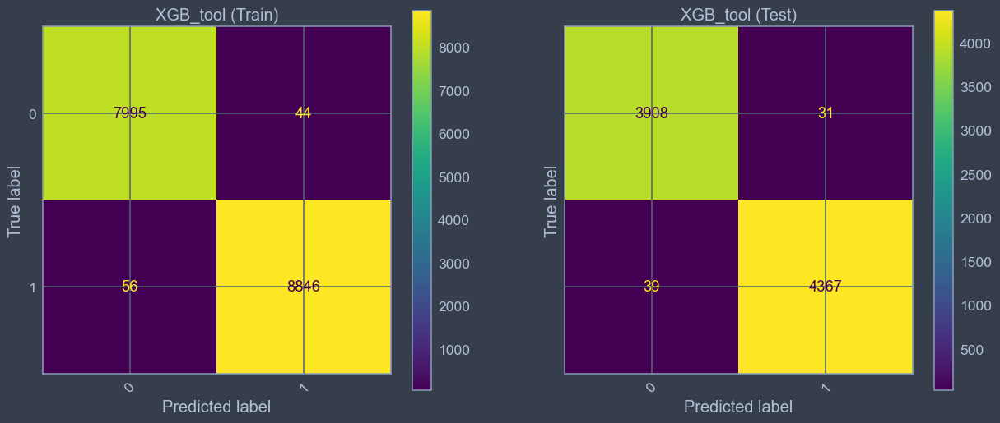

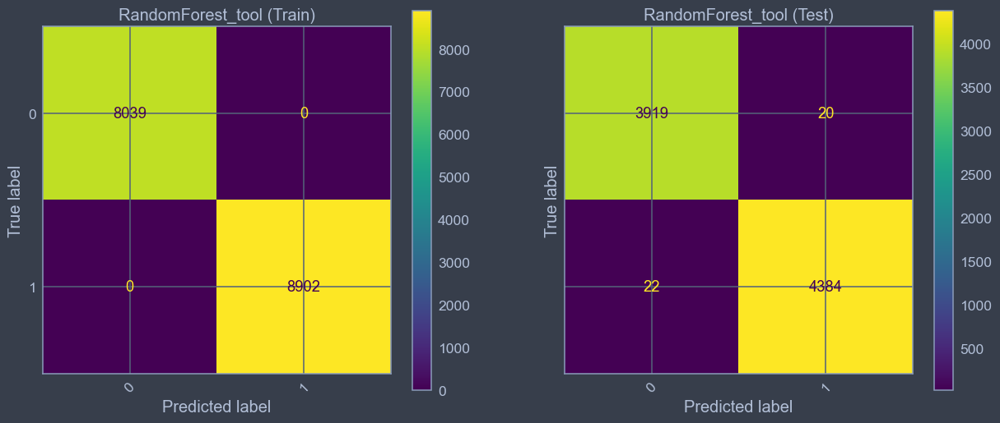

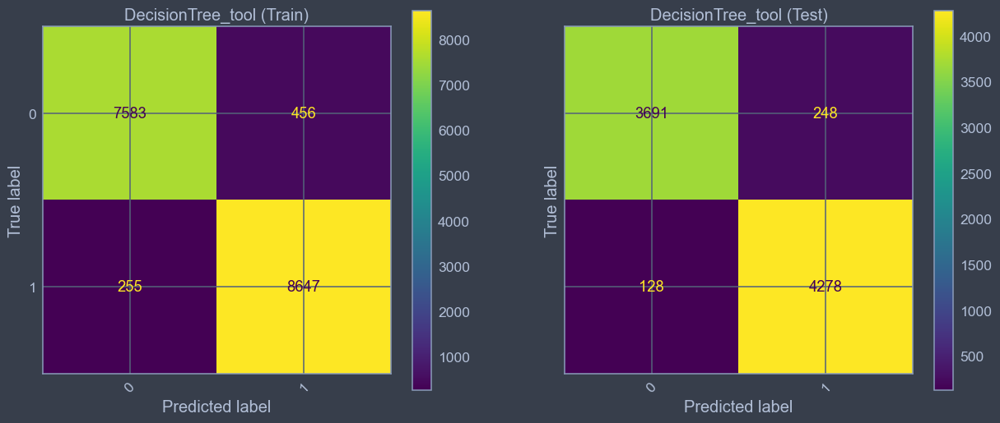

In [90]:
draw_confusion_matrix(models_tool, y_train_tool, y_test_tool, train_preds_tool, test_preds_tool)

### Target: machining_finalized

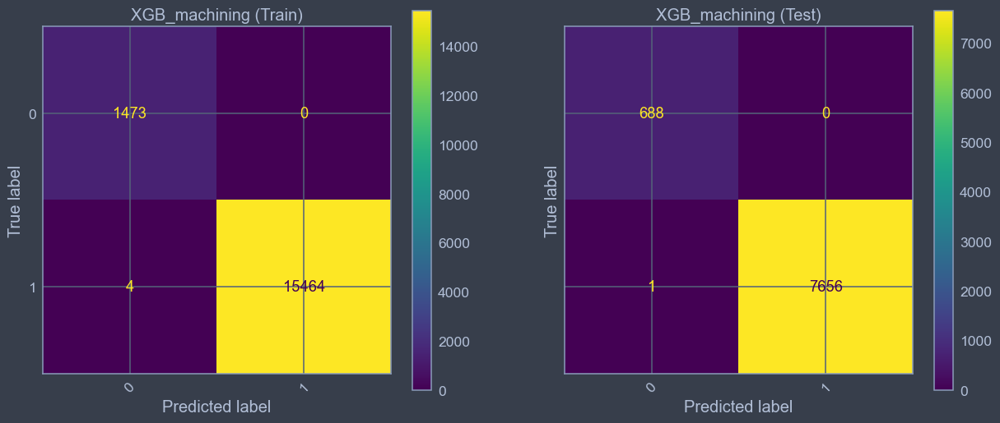

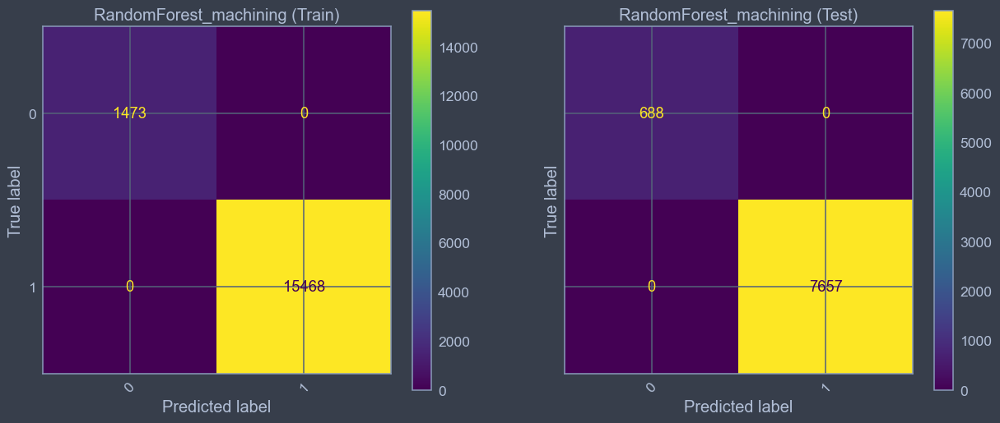

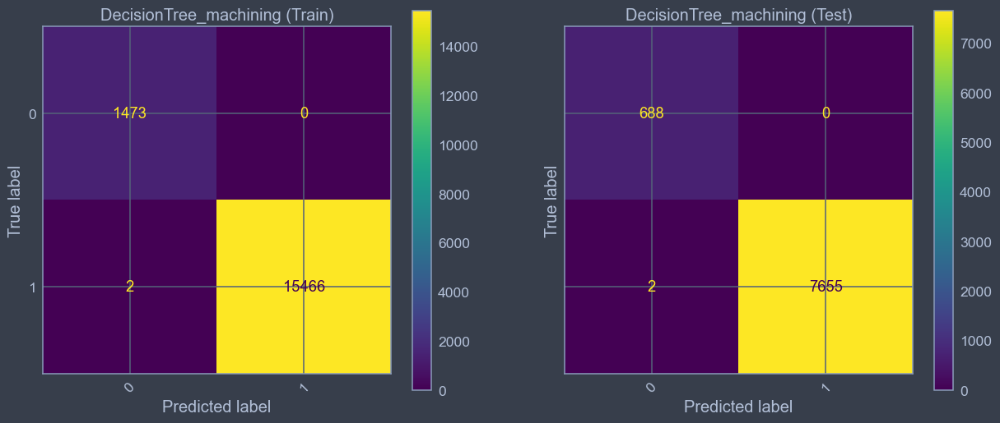

In [91]:
draw_confusion_matrix(models_machining, y_train_machining, y_test_machining, train_preds_machining, test_preds_machining)

### Target: passed_visual_inspection

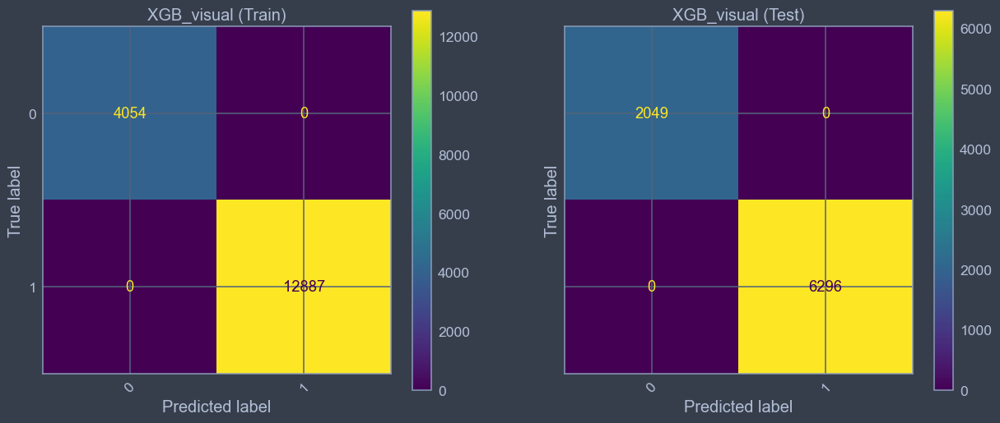

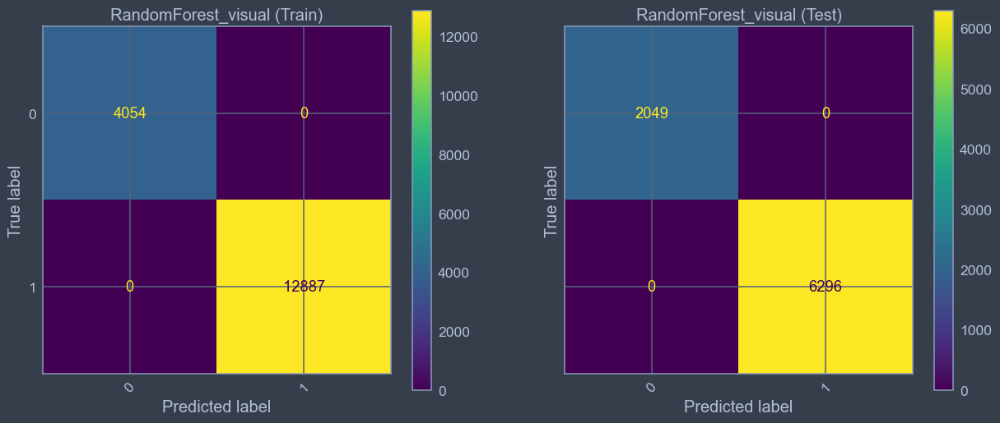

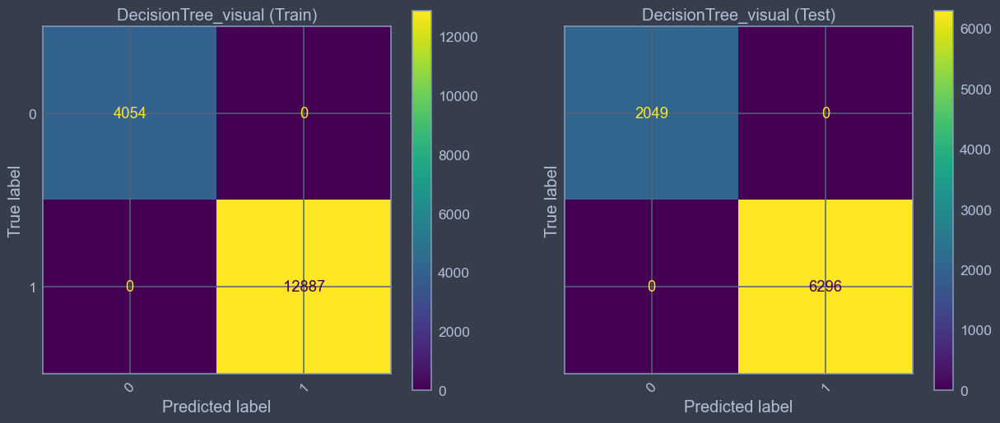

In [92]:
draw_confusion_matrix(models_visual, y_train_visual, y_test_visual, train_preds_visual, test_preds_visual)

## Classification report

### Function to print Classificatin report

In [93]:
def print_classification_report(models, y_tr, y_te, train_pred, test_pred):
    for name in models.keys():
        print(name, ' (Train)', '\n', classification_report(y_tr, train_pred[name]), '\n')
        print(name, ' (Test)', '\n', classification_report(y_te, test_pred[name]))
        print('=' * 100, '\n')

### Target: tool_condition

In [94]:
print_classification_report(models_tool, y_train_tool, y_test_tool, train_preds_tool, test_preds_tool)

XGB_tool  (Train) 
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      8039
           1       1.00      0.99      0.99      8902

    accuracy                           0.99     16941
   macro avg       0.99      0.99      0.99     16941
weighted avg       0.99      0.99      0.99     16941
 

XGB_tool  (Test) 
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      3939
           1       0.99      0.99      0.99      4406

    accuracy                           0.99      8345
   macro avg       0.99      0.99      0.99      8345
weighted avg       0.99      0.99      0.99      8345


RandomForest_tool  (Train) 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      8039
           1       1.00      1.00      1.00      8902

    accuracy                           1.00     16941
   macro avg       1.00      1.00      1.00     16941
wei

### Target: machining_finalized

In [95]:
print_classification_report(models_machining, y_train_machining, y_test_machining, train_preds_machining, test_preds_machining)

XGB_machining  (Train) 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1473
           1       1.00      1.00      1.00     15468

    accuracy                           1.00     16941
   macro avg       1.00      1.00      1.00     16941
weighted avg       1.00      1.00      1.00     16941
 

XGB_machining  (Test) 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       688
           1       1.00      1.00      1.00      7657

    accuracy                           1.00      8345
   macro avg       1.00      1.00      1.00      8345
weighted avg       1.00      1.00      1.00      8345


RandomForest_machining  (Train) 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1473
           1       1.00      1.00      1.00     15468

    accuracy                           1.00     16941
   macro avg       1.00      1.00      1.0

### Target: passed_visual_inspection

In [96]:
print_classification_report(models_visual, y_train_visual, y_test_visual, train_preds_visual, test_preds_visual)

XGB_visual  (Train) 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      4054
           1       1.00      1.00      1.00     12887

    accuracy                           1.00     16941
   macro avg       1.00      1.00      1.00     16941
weighted avg       1.00      1.00      1.00     16941
 

XGB_visual  (Test) 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      2049
           1       1.00      1.00      1.00      6296

    accuracy                           1.00      8345
   macro avg       1.00      1.00      1.00      8345
weighted avg       1.00      1.00      1.00      8345


RandomForest_visual  (Train) 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      4054
           1       1.00      1.00      1.00     12887

    accuracy                           1.00     16941
   macro avg       1.00      1.00      1.00     169

## Precision

### Function to print Precision

In [140]:
def print_precision(models, y_tr, y_te, train_pred, test_pred):
    precision_train_dict = {}
    precision_test_dict = {}
    
    for name in models.keys():
        precision_score_train = precision_score(y_tr, train_pred[name])
        precision_score_test = precision_score(y_te, test_pred[name])  
        precision_train_dict[name] = precision_score_train
        precision_test_dict[name] = precision_score_test
        print(name, ' Precision score (Train)', precision_score_train, '\n',)
        print(name, ' Precision score (Test)', precision_score_test, '\n', )
        print('=' * 100, '\n')
    return precision_train_dict, precision_test_dict

### Target: tool_condition

In [141]:
precision_train_dict_tool, precision_test_dict_tool = print_precision(models_tool, y_train_tool, y_test_tool, train_preds_tool, test_preds_tool)

XGB_tool  Precision score (Train) 0.9950506186726659 

XGB_tool  Precision score (Test) 0.9929513415188722 


RandomForest_tool  Precision score (Train) 1.0 

RandomForest_tool  Precision score (Test) 0.9954586739327884 


DecisionTree_tool  Precision score (Train) 0.9499066241898275 

DecisionTree_tool  Precision score (Test) 0.9452054794520548 




### Target: machining_finalized

In [142]:
precision_train_dict_machining, precision_test_dict_machining = print_precision(models_machining, y_train_machining, y_test_machining, train_preds_machining, test_preds_machining)

XGB_machining  Precision score (Train) 1.0 

XGB_machining  Precision score (Test) 1.0 


RandomForest_machining  Precision score (Train) 1.0 

RandomForest_machining  Precision score (Test) 1.0 


DecisionTree_machining  Precision score (Train) 1.0 

DecisionTree_machining  Precision score (Test) 1.0 




### Target: passed_visual_inspection

In [143]:
precision_train_dict_visual, precision_test_dict_visual = print_precision(models_visual, y_train_visual, y_test_visual, train_preds_visual, test_preds_visual)

XGB_visual  Precision score (Train) 1.0 

XGB_visual  Precision score (Test) 1.0 


RandomForest_visual  Precision score (Train) 1.0 

RandomForest_visual  Precision score (Test) 1.0 


DecisionTree_visual  Precision score (Train) 1.0 

DecisionTree_visual  Precision score (Test) 1.0 




## Recall

### Function to print Recall

In [144]:
def print_recall(models, y_tr, y_te, train_pred, test_pred):
    recall_train_dict = {}
    recall_test_dict = {}
    
    for name in models.keys():
        recall_score_train = recall_score(y_tr, train_pred[name])
        recall_score_test = recall_score(y_te, test_pred[name])  
        recall_train_dict[name] = recall_score_train
        recall_test_dict[name] = recall_score_test
        print(name, ' Recall score (Train)', recall_score_train, '\n',)
        print(name, ' Recall score (Test)', recall_score_test, '\n', )
        print('=' * 100, '\n')
    return recall_train_dict, recall_test_dict

### Target: tool_condition

In [145]:
recall_train_dict_tool, recall_test_dict_tool = print_recall(models_tool, y_train_tool, y_test_tool, train_preds_tool, test_preds_tool)

XGB_tool  Recall score (Train) 0.9937092788137497 

XGB_tool  Recall score (Test) 0.9911484339536994 


RandomForest_tool  Recall score (Train) 1.0 

RandomForest_tool  Recall score (Test) 0.9950068088969587 


DecisionTree_tool  Recall score (Train) 0.9713547517411818 

DecisionTree_tool  Recall score (Test) 0.9709487063095779 




### Target: machining_finalized

In [146]:
recall_train_dict_machining, recall_test_dict_machining = print_recall(models_machining, y_train_machining, y_test_machining, train_preds_machining, test_preds_machining)

XGB_machining  Recall score (Train) 0.99974140160331 

XGB_machining  Recall score (Test) 0.9998694005485177 


RandomForest_machining  Recall score (Train) 1.0 

RandomForest_machining  Recall score (Test) 1.0 


DecisionTree_machining  Recall score (Train) 0.9998707008016551 

DecisionTree_machining  Recall score (Test) 0.9997388010970354 




### Target: passed_visual_inspection

In [147]:
recall_train_dict_visual, recall_test_dict_visual = print_recall(models_visual, y_train_visual, y_test_visual, train_preds_visual, test_preds_visual)

XGB_visual  Recall score (Train) 1.0 

XGB_visual  Recall score (Test) 1.0 


RandomForest_visual  Recall score (Train) 1.0 

RandomForest_visual  Recall score (Test) 1.0 


DecisionTree_visual  Recall score (Train) 1.0 

DecisionTree_visual  Recall score (Test) 1.0 




## Accuracy

### Function to print Accuracy

In [148]:
def print_accuracy(models, y_tr, y_te, train_pred, test_pred):
    accuracy_train_dict = {}
    accuracy_test_dict = {}
    
    for name in models.keys():
        accuracy_score_train = accuracy_score(y_tr, train_pred[name])
        accuracy_score_test = accuracy_score(y_te, test_pred[name])  
        accuracy_train_dict[name] = accuracy_score_train
        accuracy_test_dict[name] =accuracy_score_test
        print(name, ' Accuracy score (Train)', accuracy_score_train, '\n',)
        print(name, ' Accuracy score (Test)', accuracy_score_test, '\n', )
        print('=' * 100, '\n')
    return accuracy_train_dict, accuracy_test_dict

### Target: tool_condition

In [149]:
accuracy_train_dict_tool, accuracy_test_dict_tool = print_accuracy(models_tool, y_train_tool, y_test_tool, train_preds_tool, test_preds_tool)

XGB_tool  Accuracy score (Train) 0.9940971607343132 

XGB_tool  Accuracy score (Test) 0.9916117435590174 


RandomForest_tool  Accuracy score (Train) 1.0 

RandomForest_tool  Accuracy score (Test) 0.9949670461354104 


DecisionTree_tool  Accuracy score (Train) 0.9580308128209669 

DecisionTree_tool  Accuracy score (Test) 0.9549430796884362 




### Target: machining_finalized

In [150]:
accuracy_train_dict_machining, accuracy_test_dict_machining = print_accuracy(models_machining, y_train_machining, y_test_machining, train_preds_machining, test_preds_machining)

XGB_machining  Accuracy score (Train) 0.9997638864293725 

XGB_machining  Accuracy score (Test) 0.9998801677651288 


RandomForest_machining  Accuracy score (Train) 1.0 

RandomForest_machining  Accuracy score (Test) 1.0 


DecisionTree_machining  Accuracy score (Train) 0.9998819432146863 

DecisionTree_machining  Accuracy score (Test) 0.9997603355302577 




### Target: passed_visual_inspection

In [151]:
accuracy_train_dict_visual, accuracy_test_dict_visual = print_accuracy(models_visual, y_train_visual, y_test_visual, train_preds_visual, test_preds_visual)

XGB_visual  Accuracy score (Train) 1.0 

XGB_visual  Accuracy score (Test) 1.0 


RandomForest_visual  Accuracy score (Train) 1.0 

RandomForest_visual  Accuracy score (Test) 1.0 


DecisionTree_visual  Accuracy score (Train) 1.0 

DecisionTree_visual  Accuracy score (Test) 1.0 




## Roc-auc

## Function to print Roc-auc

In [152]:
def print_roc_auc(models, y_tr, y_te, train_pred_proba, test_pred_proba):
    roc_auc_train_dict = {}
    roc_auc_test_dict = {}

    for name in models.keys():
        roc_auc_score_train = roc_auc_score(y_tr, train_pred_proba[name][:, 1])
        roc_auc_score_test = roc_auc_score(y_te, test_pred_proba[name][:, 1])  
        roc_auc_train_dict[name] = roc_auc_score_train
        roc_auc_test_dict[name] = roc_auc_score_test
        print(name, ' Roc-auc score (Train)', roc_auc_score_train, '\n', )
        print(name, ' Roc-auc score (Test)', roc_auc_score_test, '\n', )
        print('=' * 100, '\n')
    return roc_auc_train_dict, roc_auc_test_dict

### Target: tool_condition

In [153]:
roc_auc_train_dict_tool, roc_auc_test_dict_tool = print_roc_auc(models_tool, y_train_tool, y_test_tool, train_preds_proba_tool, test_preds_proba_tool)

XGB_tool  Roc-auc score (Train) 0.9998397499898621 

XGB_tool  Roc-auc score (Test) 0.9996223041417938 


RandomForest_tool  Roc-auc score (Train) 1.0 

RandomForest_tool  Roc-auc score (Test) 0.9999158179025417 


DecisionTree_tool  Roc-auc score (Train) 0.994844303868115 

DecisionTree_tool  Roc-auc score (Test) 0.99230333051113 




### Target: machining_finalized

In [154]:
roc_auc_train_dict_machining, roc_auc_test_dict_machining = print_roc_auc(models_machining, y_train_machining, y_test_machining, train_preds_proba_machining, test_preds_proba_machining)

XGB_machining  Roc-auc score (Train) 1.0 

XGB_machining  Roc-auc score (Test) 1.0 


RandomForest_machining  Roc-auc score (Train) 1.0 

RandomForest_machining  Roc-auc score (Test) 1.0 


DecisionTree_machining  Roc-auc score (Train) 0.999996664379133 

DecisionTree_machining  Roc-auc score (Test) 0.9999933561325555 




### Target: passed_visual_inspection

In [155]:
roc_auc_train_dict_visual, roc_auc_test_dict_visual = print_roc_auc(models_visual, y_train_visual, y_test_visual, train_preds_proba_visual, test_preds_proba_visual)

XGB_visual  Roc-auc score (Train) 1.0 

XGB_visual  Roc-auc score (Test) 1.0 


RandomForest_visual  Roc-auc score (Train) 1.0 

RandomForest_visual  Roc-auc score (Test) 1.0 


DecisionTree_visual  Roc-auc score (Train) 1.0 

DecisionTree_visual  Roc-auc score (Test) 1.0 




# STEP 9: Displaying results

## Function for displaying

In [156]:
def show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title):
    fig, ax = plt.subplots(figsize=(14,7), facecolor=(.94, .94, .94))
    plt.tight_layout()
    
    y = np.arange(len(labels))  # Label locations
    ax.barh(y + width/2, first_bar, width, label=first_bar_label, color='cornflowerblue')
    ax.barh(y - width/2, second_bar, width, label=second_bar_label, color='lightgreen')
    
    title = plt.title(plot_title, pad=20, fontsize=18, color = 'black')
    
    rects = ax.patches
    for rect in rects:
        x_value = rect.get_width()
        y_value = rect.get_y() + rect.get_height() / 2
        space = 5
        ha = 'left'
        plt.annotate(
            np.round(x_value, 3),                      
            (x_value, y_value),         
            xytext=(space, 0),          
            textcoords='offset points',
            va='center',                
            ha=ha)
    
    ax.set_yticklabels(labels, color = 'black')
    ax.legend(loc = 'best')
    
    plt.yticks(np.arange(min(y), max(y)+1, 1.0))
    
 

## Target: tool_condition

### Recall

D:\Anaconda\envs\KV_DW_JL_5\lib\site-packages\ipykernel_launcher.py:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



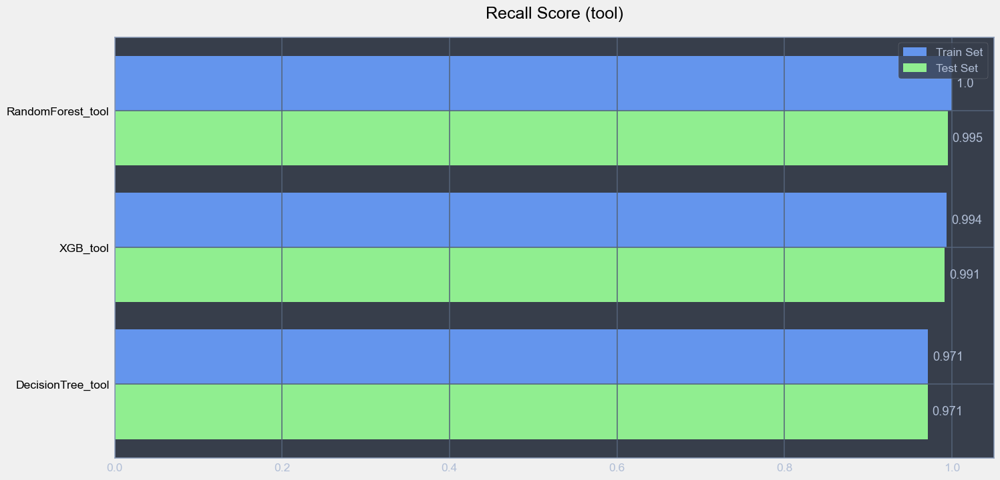

In [158]:
recall_test_dict_tool = dict(sorted(recall_test_dict_tool.items(), key = lambda item: item[1]))
sorted_keys = recall_test_dict_tool.keys()
recall_train_dict_tool = {key: recall_train_dict_tool[key] for key in sorted_keys}

first_bar = recall_train_dict_tool.values()
first_bar_label = 'Train Set'
second_bar = recall_test_dict_tool.values()
second_bar_label = 'Test Set'
labels = sorted_keys
width = 0.4
plot_title = 'Recall Score (tool)'


show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title) 

### Precision

D:\Anaconda\envs\KV_DW_JL_5\lib\site-packages\ipykernel_launcher.py:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



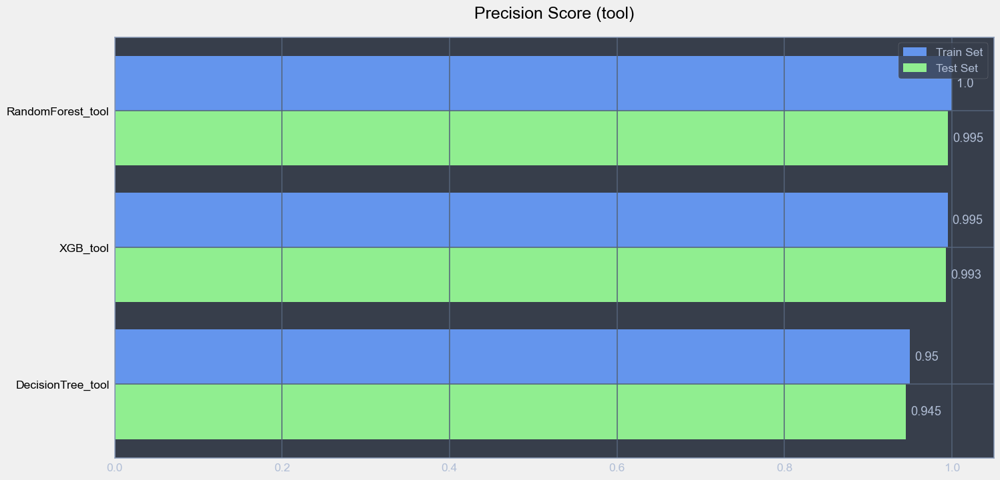

In [160]:
precision_test_dict_tool = dict(sorted(precision_test_dict_tool.items(), key = lambda item: item[1]))
sorted_keys = precision_test_dict_tool.keys()
precision_train_dict_tool = {key: precision_train_dict_tool[key] for key in sorted_keys}

first_bar = precision_train_dict_tool.values()
first_bar_label = 'Train Set'
second_bar = precision_test_dict_tool.values()
second_bar_label = 'Test Set'
labels = sorted_keys
width = 0.4
plot_title = 'Precision Score (tool)'


show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title) 

### Accuracy

D:\Anaconda\envs\KV_DW_JL_5\lib\site-packages\ipykernel_launcher.py:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



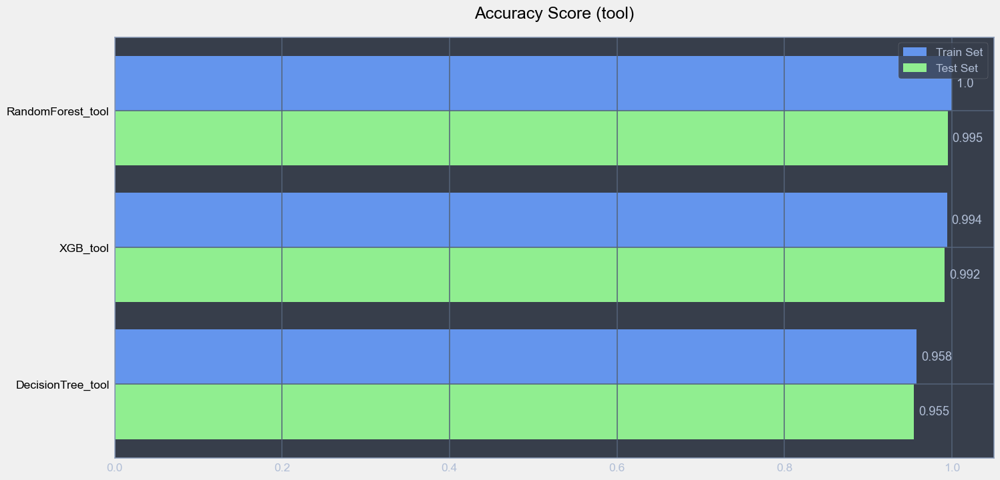

In [161]:
accuracy_test_dict_tool = dict(sorted(accuracy_test_dict_tool.items(), key = lambda item: item[1]))
sorted_keys = accuracy_test_dict_tool.keys()
accuracy_train_dict_tool = {key: accuracy_train_dict_tool[key] for key in sorted_keys}

first_bar = accuracy_train_dict_tool.values()
first_bar_label = 'Train Set'
second_bar = accuracy_test_dict_tool.values()
second_bar_label = 'Test Set'
labels = sorted_keys
width = 0.4
plot_title = 'Accuracy Score (tool)'


show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title) 

### Roc-auc

D:\Anaconda\envs\KV_DW_JL_5\lib\site-packages\ipykernel_launcher.py:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



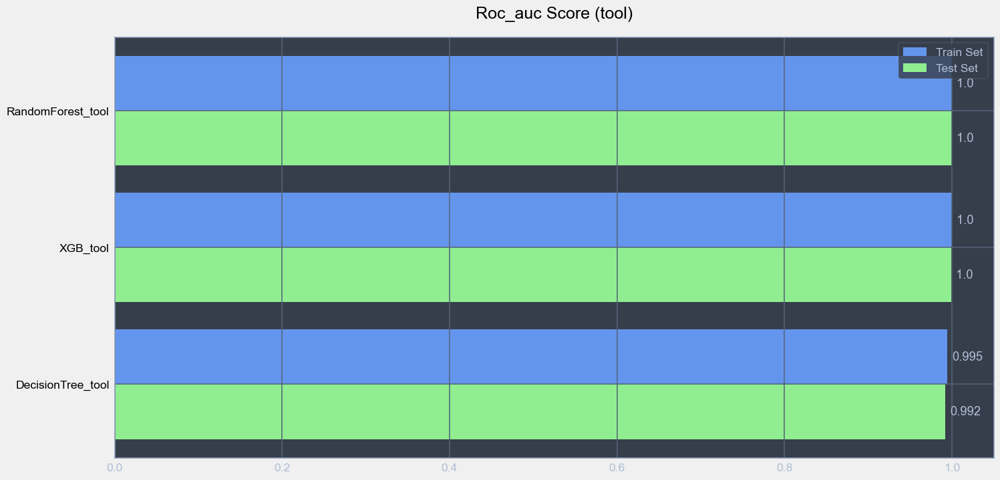

In [162]:
roc_auc_test_dict_tool = dict(sorted(roc_auc_test_dict_tool.items(), key = lambda item: item[1]))
sorted_keys = roc_auc_test_dict_tool.keys()
roc_auc_train_dict_tool = {key: roc_auc_train_dict_tool[key] for key in sorted_keys}

first_bar = roc_auc_train_dict_tool.values()
first_bar_label = 'Train Set'
second_bar = roc_auc_test_dict_tool.values()
second_bar_label = 'Test Set'
labels = sorted_keys
width = 0.4
plot_title = 'Roc_auc Score (tool)'


show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title) 

    After displaying all results for predicting tool_condition, We can conclude that according to the matrixes we used (Precistion, Recall, Accuracy and Roc_auc), the best choise here is the RandomForestClassifier, bacause it gives the best performance without any causes of overfitting

## Target: machining_finalized

### Recall

D:\Anaconda\envs\KV_DW_JL_5\lib\site-packages\ipykernel_launcher.py:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



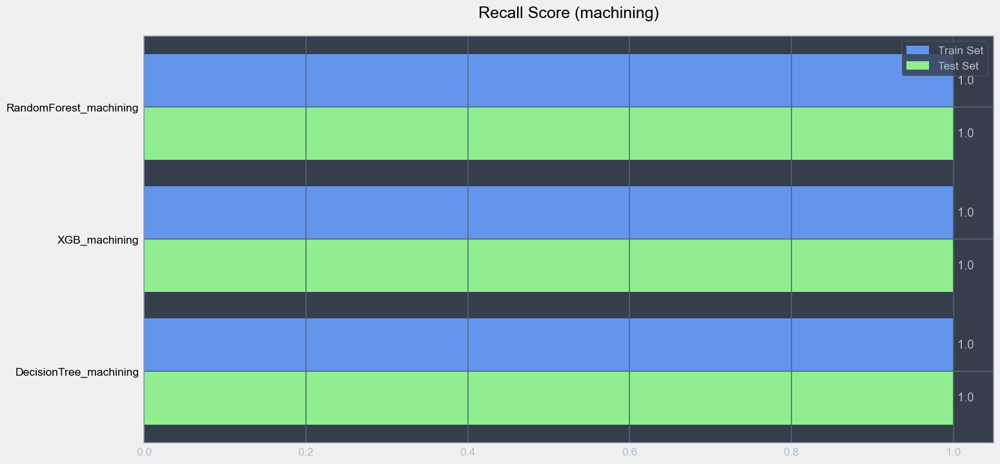

In [163]:
recall_test_dict_machining = dict(sorted(recall_test_dict_machining.items(), key = lambda item: item[1]))
sorted_keys = recall_test_dict_machining.keys()
recall_train_dict_machining = {key: recall_train_dict_machining[key] for key in sorted_keys}

first_bar = recall_train_dict_machining.values()
first_bar_label = 'Train Set'
second_bar = recall_test_dict_machining.values()
second_bar_label = 'Test Set'
labels = sorted_keys
width = 0.4
plot_title = 'Recall Score (machining)'


show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title) 

### Precision

D:\Anaconda\envs\KV_DW_JL_5\lib\site-packages\ipykernel_launcher.py:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



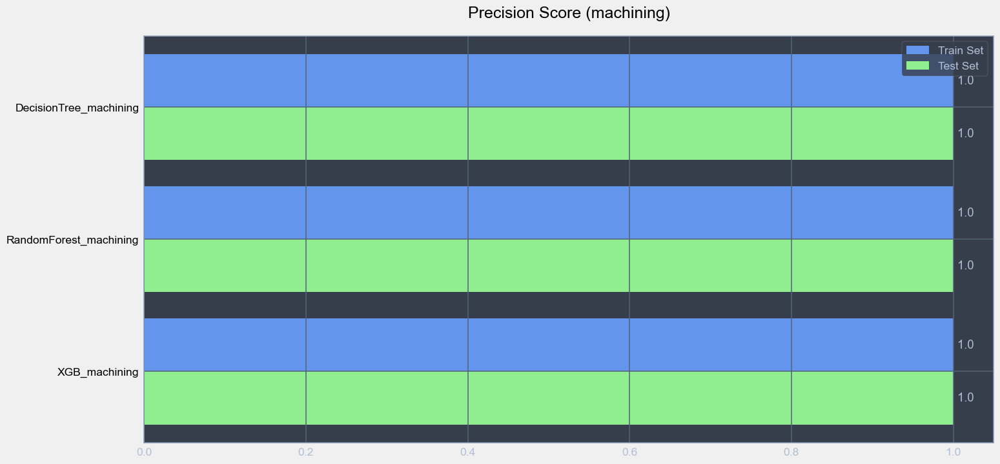

In [164]:
precision_test_dict_machining = dict(sorted(precision_test_dict_machining.items(), key = lambda item: item[1]))
sorted_keys = precision_test_dict_machining.keys()
precision_train_dict_machining = {key: precision_train_dict_machining[key] for key in sorted_keys}

first_bar = precision_train_dict_machining.values()
first_bar_label = 'Train Set'
second_bar = precision_test_dict_machining.values()
second_bar_label = 'Test Set'
labels = sorted_keys
width = 0.4
plot_title = 'Precision Score (machining)'


show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title) 

### Accuracy

D:\Anaconda\envs\KV_DW_JL_5\lib\site-packages\ipykernel_launcher.py:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



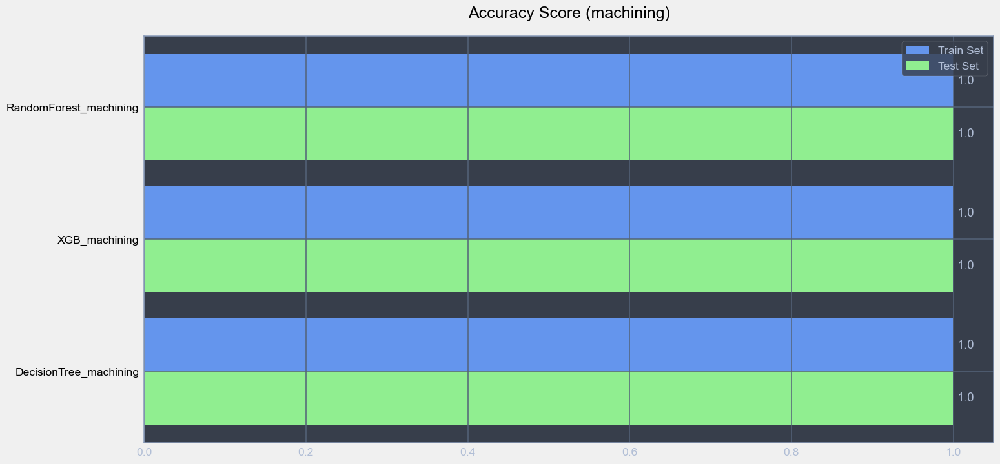

In [165]:
accuracy_test_dict_machining = dict(sorted(accuracy_test_dict_machining.items(), key = lambda item: item[1]))
sorted_keys = accuracy_test_dict_machining.keys()
accuracy_train_dict_machining = {key: accuracy_train_dict_machining[key] for key in sorted_keys}

first_bar = accuracy_train_dict_machining.values()
first_bar_label = 'Train Set'
second_bar = accuracy_test_dict_machining.values()
second_bar_label = 'Test Set'
labels = sorted_keys
width = 0.4
plot_title = 'Accuracy Score (machining)'


show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title) 

### Roc-auc

D:\Anaconda\envs\KV_DW_JL_5\lib\site-packages\ipykernel_launcher.py:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



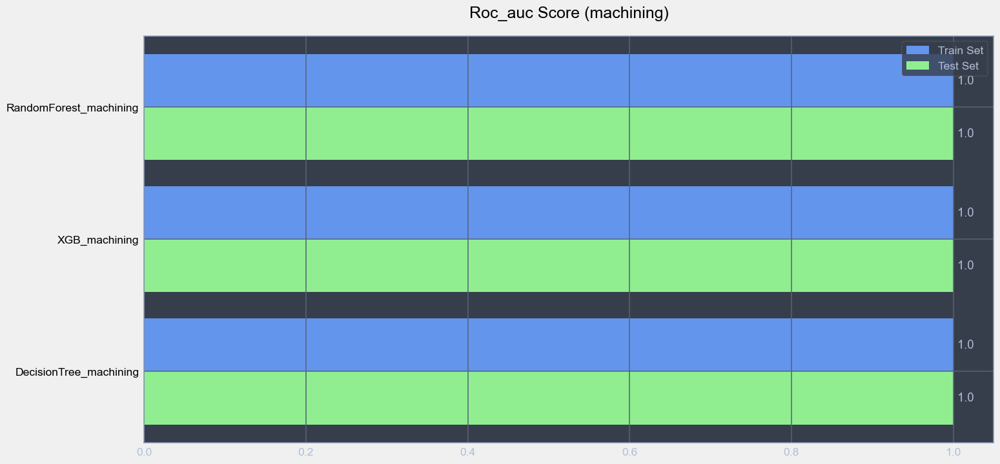

In [166]:
roc_auc_test_dict_machining = dict(sorted(roc_auc_test_dict_machining.items(), key = lambda item: item[1]))
sorted_keys = roc_auc_test_dict_machining.keys()
roc_auc_train_dict_machining = {key: roc_auc_train_dict_machining[key] for key in sorted_keys}

first_bar = roc_auc_train_dict_machining.values()
first_bar_label = 'Train Set'
second_bar = roc_auc_test_dict_machining.values()
second_bar_label = 'Test Set'
labels = sorted_keys
width = 0.4
plot_title = 'Roc_auc Score (machining)'


show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title) 

    After displaying all results for predicting machining_finalized, We can conclude that according to the matrixes we used (Precistion, Recall, Accuracy and Roc_auc), We can use any of the model we have tested in this project (RandomForestClassifier, XGBoostClassifier and DecisionTreeClassifier), because all of them gives the best performances without any causes of overfitting

## Target: passed_visual_inspection

### Recall

D:\Anaconda\envs\KV_DW_JL_5\lib\site-packages\ipykernel_launcher.py:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



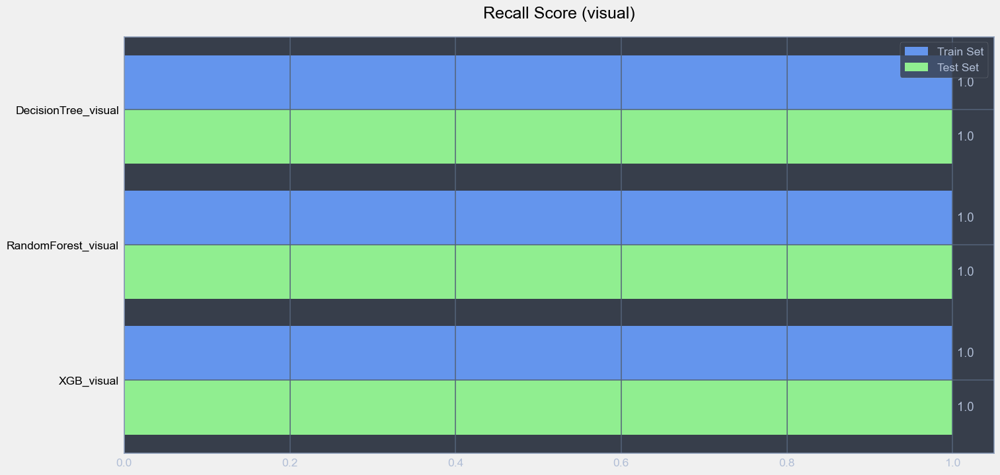

In [167]:
recall_test_dict_visual = dict(sorted(recall_test_dict_visual.items(), key = lambda item: item[1]))
sorted_keys = recall_test_dict_visual.keys()
recall_train_dict_visual = {key: recall_train_dict_visual[key] for key in sorted_keys}

first_bar = recall_train_dict_visual.values()
first_bar_label = 'Train Set'
second_bar = recall_test_dict_visual.values()
second_bar_label = 'Test Set'
labels = sorted_keys
width = 0.4
plot_title = 'Recall Score (visual)'


show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title) 

### Precision

D:\Anaconda\envs\KV_DW_JL_5\lib\site-packages\ipykernel_launcher.py:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



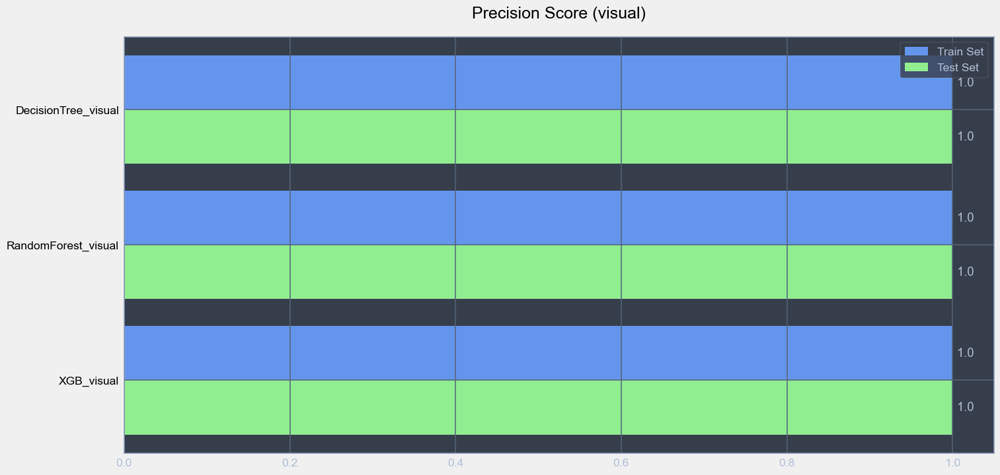

In [168]:
precision_test_dict_visual = dict(sorted(precision_test_dict_visual.items(), key = lambda item: item[1]))
sorted_keys = precision_test_dict_visual.keys()
precision_train_dict_visual = {key: precision_train_dict_visual[key] for key in sorted_keys}

first_bar = precision_train_dict_visual.values()
first_bar_label = 'Train Set'
second_bar = precision_test_dict_visual.values()
second_bar_label = 'Test Set'
labels = sorted_keys
width = 0.4
plot_title = 'Precision Score (visual)'


show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title) 

### Accuracy

D:\Anaconda\envs\KV_DW_JL_5\lib\site-packages\ipykernel_launcher.py:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



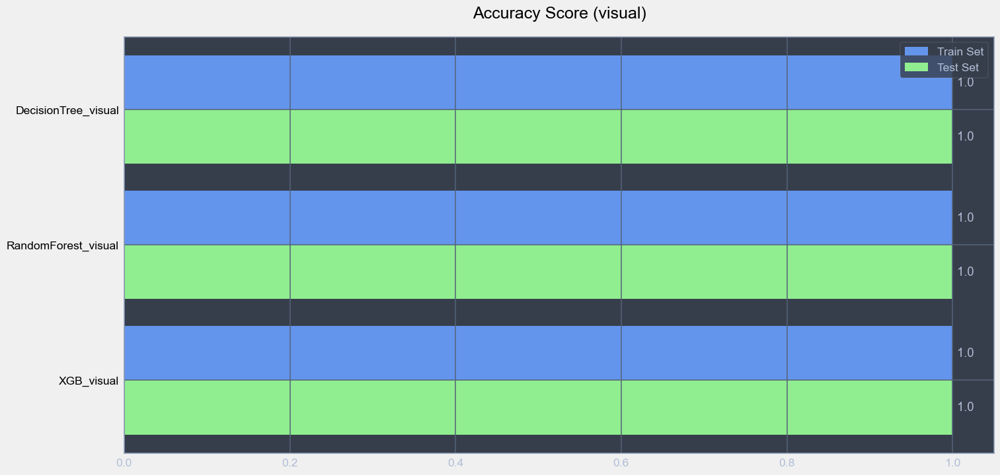

In [169]:
accuracy_test_dict_visual = dict(sorted(accuracy_test_dict_visual.items(), key = lambda item: item[1]))
sorted_keys = accuracy_test_dict_visual.keys()
accuracy_train_dict_visual = {key: accuracy_train_dict_visual[key] for key in sorted_keys}

first_bar = accuracy_train_dict_visual.values()
first_bar_label = 'Train Set'
second_bar = accuracy_test_dict_visual.values()
second_bar_label = 'Test Set'
labels = sorted_keys
width = 0.4
plot_title = 'Accuracy Score (visual)'


show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title) 

### Roc-auc

D:\Anaconda\envs\KV_DW_JL_5\lib\site-packages\ipykernel_launcher.py:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



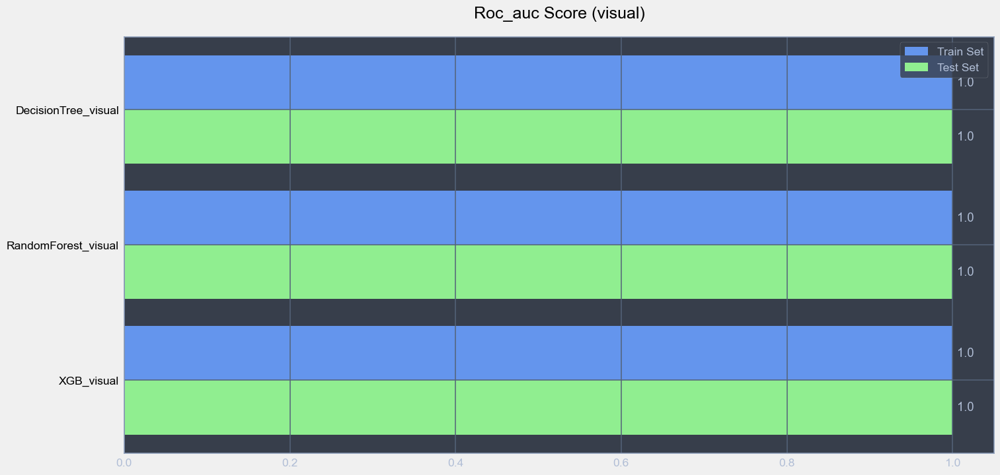

In [170]:
roc_auc_test_dict_visual = dict(sorted(roc_auc_test_dict_visual.items(), key = lambda item: item[1]))
sorted_keys = roc_auc_test_dict_visual.keys()
roc_auc_train_dict_visual = {key: roc_auc_train_dict_visual[key] for key in sorted_keys}

first_bar = roc_auc_train_dict_visual.values()
first_bar_label = 'Train Set'
second_bar = roc_auc_test_dict_visual.values()
second_bar_label = 'Test Set'
labels = sorted_keys
width = 0.4
plot_title = 'Roc_auc Score (visual)'


show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title) 

    After displaying all results for predicting passed_visual_inspection, We can conclude that according to the matrixes we used (Precistion, Recall, Accuracy and Roc_auc), We can use any of the model we have tested in this project (RandomForestClassifier, XGBoostClassifier and DecisionTreeClassifier), because all of them gives the best performances without any causes of overfitting

# STEP 10: Saving everything

## Saving models: tool_condition_set

In [ ]:
dump(XGB_tool, open('XGB_tool.pkl', 'wb'))
dump(RandomForest_tool, open('RandomForest_tool.pkl', 'wb'))
dump(DecisionTree_tool, open('DecisionTree_tool.pkl', 'wb'))

## Saving models: machining_finalized_set

In [ ]:
dump(XGB_machining, open('XGB_machining.pkl', 'wb'))
dump(RandomForest_machining, open('RandomForest_machining.pkl', 'wb'))
dump(DecisionTree_machining, open('DecisionTree_machining.pkl', 'wb'))

## Saving models: passed_visual_inspection_set

In [ ]:
dump(XGB_visual, open('XGB_visual.pkl', 'wb'))
dump(RandomForest_visual, open('RandomForest_visual.pkl', 'wb'))
dump(DecisionTree_visual, open('DecisionTree_visual.pkl', 'wb'))

# STEP 11: Conclusion

##  Data Analysis

    After completing the data analysis step, we found several insights. 

        1. the amount of labels 'Starting' and 'end' in variable 'Machining_Process' is relatively small and thus creates outliers

        2. More than half of the samples were done with feedrate 3, while almost half of the samples had 4.0 pressure on clamp

        3. feedrate on worn machines has more variation like 12 and 15 which are being abset on unworn tools, but feedrate 3 is still the most common one, taking more than 50% on both worn and unworn tools.

        4. clamp_pressure seems to not change significantly and has almost the same counts on both worn and unworn tools. 

        5. nearly half of the experiment was made with worn tools, while the other half with unworn 

        6. more than 90% of experiments were successfully finished by the machine

        7. more than 75% of the experiment passed the visual inspection by human

        8. the count of details that didn't pass visual inspection by humans is higher than the amount of details that didn't pass the machining process. We assume that is because humans have some tricks and techniques to detect failures and waste, which machines can't do.

        9. Count of 'Not Finalized Machining' with worn tools is almost the same as that with unworn tools. It means that regardless of the tool condition, the detail will be finished by the machine.

        10.Count of 'Not Passed Visual insepction with worn tool is relatively larger than that with unworn tool. 

        11.We assume that the tool condition does affect the process of machining itself, but not dramatically as failure and waste can occur on unwarn tools as well, but in smaller proportions and unlike machines, humans can notice the difference affected by warn tools. 

        12.'Z1_CurrentFeedback', 'Z1_DCBusVoltage', 'Z1_OutputCurrent', 'Z1_OutputVoltage', 'Z1_SystemInertia' are constant variables

        13.There are no null values in the dataset.

        14.tool_condition seems to be relatively balanced

        15.machining_finalized seems to be  not balanced at all

        16.passed_visual_inspection seems to be not balanced

        
        
   ## Training & Evaluating models
  
     > We worked with three different targets and applied all the steps below to each individual target.

     > We have tested 3 methods of balancing the dataset

     > We have tested 5 popular models with the same data and same preprocessing steps to then compare them and choose only fixed amounts to tune the hyperparameters. 

     > After testing 5 models, we chose only 3 best models according to the accuracy metrics 

     > Then, we used cross-validation and started to fine-tune hyperparameters to boost the performance 

     > lastly, We have evaluated the models we built using several metrics including: 

         1. F1 score

         2. Roc-auc 

         3. Confusion Matrix 

         4. Precision

         5. Recall 

         6. Accuracy

         
    By analyzing all metrics we can tell that: 

        1. We need to encode the Machining_Process

        2. It seems that the models trained on data balanced by RandomOverSampler give the best performances without any causes of overfitting for predicting Machining_process

        3. It seems that the model works equally well on both balanced and not balanced datasets and gives the highest performance without any causes of overfitting for predicting passed_visual_inspection.

        4. Even after fine-tuning of hyperparameters by RandomSearchCV, the results of models are almost the same. We assume that tuning the hyperparameters is not necessary in this project, because most models give almost 100% of performance by default settings.

        5. According to the matrixes we used (Precistion, Recall, Accuracy and ROC_AUC), the best choice for predicting tool_condition is the RandomForestClassifier, because it gives the best performance without any causes of overfitting.

        6. According to the matrixes we used (Precistion, Recall, Accuracy and Roc_auc), we can use any of the models we have tested in this project (RandomForestClassifier, XGBoostClassifier and DecisionTreeClassifier) for predicting machining_finalized, because all of them give the best performances without any causes of overfitting.

        7. According to the matrixes we used (Precistion, Recall, Accuracy and Roc_auc), we can use any of the models we have tested in this project (RandomForestClassifier, XGBoostClassifier and DecisionTreeClassifier) for predicting passed_visual_inspection, because all of them give the best performances without any causes of overfitting.

        

   # THANKS!!! :)